In [ ]:
import csv

# Define the path to the CSV file
input_file = "abrevdict.csv"

# Create an empty dictionary to store slang words and their meanings
slang = {}

# Read the CSV file and populate the slang dictionary
with open(input_file, 'r', newline='') as csvfile:
    reader = csv.reader(csvfile)
    # Skip the header row
    next(reader)
    # Iterate over each row in the CSV file
    for row in reader:
        # Extract slang word and its meaning from the row
        slang_word, meaning = row
        # Add the slang word and its meaning to the dictionary
        slang[slang_word] = meaning


# import re, json, requests

# # path = 'abrevdict.json'
# url = 'https://raw.githubusercontent.com/louisowen6/NLP_bahasa_resources/master/combined_slang_words.txt'
# slang_bahasa_dict = json.loads(requests.get(url).text)

# def fix_slang(text):
#     words = text.split(' ')
#     for index, word in enumerate(words):
#         if word in slang_bahasa_dict:
#             words[index] = slang_bahasa_dict[word]
#     return ' '.join(words)

slang

{'ngmg': 'bicara',
 'ngmong': 'bicara',
 'ngemeng': 'bicara',
 'ngiming': 'bicara',
 'bcr': 'bicara',
 'gada': 'tidak ada',
 'gaada': 'tidak ada',
 'koq': 'kok',
 'ngawuur': 'ngawur',
 'g': 'tidak',
 'jd': 'menjadi',
 'jwb': 'jawab',
 'mager': 'malas',
 'pisi': 'visi',
 'nggak': 'tidak',
 'tdk': 'tidak',
 'jelass': 'jelas',
 'bagusss': 'bagus',
 'jwbn': 'jawaban',
 'jwban': 'jawaban',
 'napsu': 'nafsu',
 'terll': 'terlalu',
 'missi': 'misi',
 'yg': 'yang',
 'gabisa': 'tidak bisa',
 'apasi': 'apa',
 'paansi': 'apa',
 'opo to': 'apa sih',
 'opo': 'apa',
 'apa si': 'apa sih',
 'blm': 'belum',
 'badassss': 'keren',
 'ngak': 'tidak',
 'gak': 'tidak',
 'nyampain': 'menyampaikan',
 'jawabbb': 'jawab',
 'bnyak': 'banyak',
 'bnyk': 'banyak',
 'kox': 'kok',
 'kyk': 'seperti',
 'misix': 'misinya',
 'dg': 'dengan',
 'nda': 'tidak',
 'menguasi': 'menguasai',
 'ngomng': 'bicara',
 'sgt': 'sangat',
 'brani': 'berani',
 'pertayaan': 'pertanyaan',
 'gk': 'tidak',
 'sngat': 'sangat',
 'hsilnyh': 'hasiln

In [ ]:
import re
from bs4 import BeautifulSoup
import html

def remove_emoji(text):
    emoji_pattern = re.compile(
        "["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
        u"\U00002702-\U000027B0"
        u"\U000024C2-\U0001F251"
        "]+", flags=re.UNICODE
    )
    return emoji_pattern.sub(r' ', text)

def preprocess_text(text):
    # Menghapus tag HTML
    soup = BeautifulSoup(text, 'html.parser')
    text_without_html = soup.get_text()

    # Mengubah entitas HTML
    clean_text = html.unescape(text_without_html)
    clean_text = remove_emoji(clean_text)
    clean_text = re.sub(r'[^\x00-\x7F]+', ' ', clean_text)

    clean_text = clean_text.lower()

    # Mengubah kata-kata yang diikuti oleh angka 2 atau tanda petik menjadi kata berulang
    # clean_text = re.sub(r'(\b\w+)([^\d]2|["“”])', r'\1 \1', clean_text)
    clean_text = re.sub(r'\b(\w+)(2|["“”])\b', r'\1 \1', clean_text)
    # Mengubah kata-kata yang diikuti oleh angka 2 atau tanda petik menjadi kata berulang
    # clean_text = re.sub(r'\b([0-9])(\w*\d+)\b', r'\1 \1', clean_text)


    # Menghapus tanda baca yang berulang lebih dari satu kali
    clean_text = re.sub(r'([.,!?;:])\1+', r' \1', clean_text)

    # Menghapus tanda baca
    clean_text = re.sub(r'([.,!;:])', '', clean_text)
    # Memisahkan tanda baca dari kata yang berdekatan
    clean_text = re.sub(r'(\w)([.,!?;:-])(\w)', r'\1 \3', clean_text)
    clean_text = re.sub(r'(\w)([.,!?;:])', r'\1' , clean_text)
    clean_text = re.sub(r'([.,!?;:])(\w)', r' \2', clean_text)

    # Mengganti "no" diikuti oleh token "satu" dengan "nomor satu"
    # clean_text = re.sub(r'\bno\s+(satu)\b', r'nomor \1', text)
    # clean_text = re.sub(r'\bno\s+(\d+)\b', r'nomor \1', text)


    # # Menghapus tanda baca yang berulang lebih dari satu kali
    # clean_text = re.sub(r'([.,!?;:])\1+', r'\1', text)

    # # Menghapus tanda baca dan menggantinya dengan spasi
    # clean_text = re.sub(r'([.,!?;:])', ' ', clean_text)

    # # Memisahkan tanda baca dari kata yang berdekatan
    # clean_text = re.sub(r'(\w)([.,!?;:-])(\w)', r'\1 \2 \3', clean_text)

    # Menghapus 'nya' yang menempel pada suatu kata
    # clean_text = re.sub(r'\b(\w+)nya\b', r'\1', clean_text)

    # Jika kata diikuti oleh "ya" dan memiliki satu "n" sebelumnya, hapus "ya"
    # clean_text = re.sub(r'\b(\w*[^n]n[^n]*?)ya\b', r'\1', clean_text)
    # clean_text = re.sub(r'\b(\w*[^n]n[^n]*?)ya\b', r'\1', clean_text)

    # Jika kata diikuti oleh "nya" dan memiliki dua "n" sebelumnya, hapus "nya"
    # clean_text = re.sub(r'\b(\w*[^n]n[^n]*?n[^n]*?)nya\b', r'\1', clean_text)
    # clean_text = re.sub(r'\b(\w+?[^n])nya\b', r'\1', clean_text)

    clean_text = ' '.join(clean_text.split())

    return clean_text

In [ ]:
import json

# Load JSON data from file
with open('project-3-at-2024-06-02-19-45-84568af4.json', 'r', encoding='utf-8') as f:
    data = json.load(f)

# Normalize the text in the JSON data
for item in data:
    if 'data' in item and 'text' in item['data']:
        item['data']['text'] = preprocess_text(item['data']['text'])
    if 'annotations' in item:
        for annotation in item['annotations'][0]['result']:
            if 'value' in annotation and 'text' in annotation['value']:
                annotation['value']['text'] = preprocess_text(annotation['value']['text'])

# Save the normalized JSON data back to a file
with open('./data_normalized.json', 'w', encoding='utf-8') as f:
    json.dump(data, f, ensure_ascii=False, indent=4)

print("Normalization complete. The normalized file has been saved.")

<ipython-input-64-da36151e51ca>:20: MarkupResemblesLocatorWarning: The input looks more like a filename than markup. You may want to open this file and pass the filehandle into Beautiful Soup.
  soup = BeautifulSoup(text, 'html.parser')


Normalization complete. The normalized file has been saved.


In [ ]:
import json

def getIndex(aspect, indexStart, txt):
    index = []
    counter = 0
    for x in txt[indexStart::-1]:
        if x == " ":
            counter += 1
    index.append(counter)
    if " " in aspect:
        for x in range(0, (aspect.count(" "))):
            index.append(counter + x + 1)
    return index

# Load JSON data from file
with open('./data_normalized.json', encoding='utf-8') as f:
    data = json.load(f)

metadata = []
for i in data:
    relationList = []
    sentence = i['data']['text']
    for n in i['annotations'][0]['result']:
        if "from_id" and "to_id" in n:  # Check if 'from_id' and 'to_id' are keys in x
            id_aspect = n['from_id']
            idOpinion = n['to_id']
            if 'labels' in n:
                sent = n["labels"][0]
                relationList.append([id_aspect, idOpinion, sent])
    metadata.append([sentence, relationList])

# Open a file in write mode to save the results
with open('./dataset.txt', 'w', encoding='utf-8') as output_file:
    for k in metadata:
        wordlist = []
        for l in k[1]:
            words = []
            for m in l:
                for i in data:
                    for x in i['annotations'][0]['result']:
                        if "value" in x:
                            if x["id"] == m:
                                word = x["value"]["text"]
                                word_start = x["value"]["start"]
                                index = getIndex(word, word_start, k[0])
                                words.append(index)
            words.append(l[2].split(":")[1])
            words = tuple(words)
            wordlist.append(words)
        res = wordlist
        # Write the formatted result to the file
        output_file.write(f"{k[0]} .####{res}\n")

In [ ]:
def getIndex(aspect, indexStart, txt):
    words = txt[:indexStart].split()
    start_idx = len(words)
    aspect_words = aspect.split()
    indices = list(range(start_idx, start_idx + len(aspect_words)))
    return indices

# Load JSON data from file
with open('./data_normalized.json', encoding='utf-8') as f:
    data = json.load(f)

metadata = []
for i in data:
    relationList = []
    sentence = i['data']['text']
    for n in i['annotations'][0]['result']:
        if "from_id" in n and "to_id" in n:
            id_aspect = n['from_id']
            id_opinion = n['to_id']
            if 'labels' in n:
                sent = n["labels"][0].split(':')[-1]  # Only take the sentiment part
                relationList.append([id_aspect, id_opinion, sent])
    metadata.append([sentence, relationList])

# Open a file in write mode to save the results
with open('./dataset.txt', 'w', encoding='utf-8') as output_file:
    for k in metadata:
        wordlist = []
        for l in k[1]:
            words = []
            for m in l[:2]:
                for i in data:
                    for x in i['annotations'][0]['result']:
                        if "value" in x:
                            if x["id"] == m:
                                word = x["value"]["text"]
                                word_start = x["value"]["start"]
                                index = getIndex(word, word_start, k[0])
                                words.append(index)
            words.append(l[2])  # Append the sentiment ('POS', 'NEU', 'NEG')
            words = tuple(words)
            wordlist.append(words)
        res = wordlist
        output_file.write(f"{k[0]} ####{res}\n")

In [ ]:
import json
import re

# Function to preprocess and normalize text (fix slang, etc.)
def preprocess_text(text):
    # Replace slang words with their meanings
    words = text.split()
    normalized_words = [slang.get(word, word) for word in words]
    return ' '.join(normalized_words)


# Function to find the start and end indices of a phrase in a tokenized text
def find_phrase_indices(phrase, text):
    words = text.split()
    phrase_words = phrase.split()
    for i in range(len(words) - len(phrase_words) + 1):
        if words[i:i + len(phrase_words)] == phrase_words:
            return list(range(i, i + len(phrase_words)))
    return []

# Load JSON data from file
with open('./data_normalized.json', encoding='utf-8') as f:
    data = json.load(f)

metadata = []
for item in data:
    relationList = []
    sentence = item['data']['text']
    name = item['data']['nama paslon']
    preprocessed_sentence = preprocess_text(sentence)

    for annotation in item['annotations'][0]['result']:
        if "from_id" in annotation and "to_id" in annotation:
            id_aspect = annotation['from_id']
            id_opinion = annotation['to_id']
            if 'labels' in annotation:
                sentiment = annotation["labels"][0].split(':')[-1]  # Only take the sentiment part
                relationList.append([id_aspect, id_opinion, sentiment])

    metadata.append([sentence, preprocessed_sentence, relationList, name])

# Open a file in write mode to save the results
with open('./dataset.txt', 'w', encoding='utf-8') as output_file:
    for k in metadata:
        original_sentence = k[0]
        preprocessed_sentence = k[1]
        wordlist = []
        name_candidates = k[3]

        for relation in k[2]:
            words = []
            for annotation_id in relation[:2]:
                for item in data:
                    for annotation in item['annotations'][0]['result']:
                        if "value" in annotation and annotation["id"] == annotation_id:
                            word = annotation["value"]["text"]
                            preprocessed_word = preprocess_text(word)
                            word_indices = find_phrase_indices(preprocessed_word, preprocessed_sentence)
                            words.append(word_indices)
            words.append(relation[2])  # Append the sentiment ('POS', 'NEU', 'NEG')
            words = tuple(words)
            wordlist.append(words)

        res = wordlist
        # output_file.write(f"{preprocessed_sentence} ####{res}\n")
        output_file.write(f"{preprocessed_sentence} ####{res}\n")

In [ ]:
import json
import re

# Function to preprocess and normalize text (fix slang, etc.)
def preprocess_text(text):
    # Replace slang words with their meanings
    words = text.split()
    normalized_words = [slang.get(word, word) for word in words]
    return ' '.join(normalized_words)


# Function to find the start and end indices of a phrase in a tokenized text
def find_phrase_indices(phrase, text):
    words = text.split()
    phrase_words = phrase.split()
    for i in range(len(words) - len(phrase_words) + 1):
        if words[i:i + len(phrase_words)] == phrase_words:
            return list(range(i, i + len(phrase_words)))
    return []

# Load JSON data from file
with open('./data_normalized.json', encoding='utf-8') as f:
    data = json.load(f)

metadata = []
for item in data:
    relationList = []
    sentence = item['data']['text']
    name = item['data']['nama paslon']
    preprocessed_sentence = preprocess_text(sentence)

    for annotation in item['annotations'][0]['result']:
        if "from_id" in annotation and "to_id" in annotation:
            id_aspect = annotation['from_id']
            id_opinion = annotation['to_id']
            if 'labels' in annotation:
                sentiment = annotation["labels"][0].split(':')[-1]  # Only take the sentiment part
                relationList.append([id_aspect, id_opinion, sentiment])

    metadata.append([sentence, preprocessed_sentence, relationList, name])

# Open a file in write mode to save the results
with open('./EDA_personal.txt', 'w', encoding='utf-8') as output_file:
    for k in metadata:
        original_sentence = k[0]
        preprocessed_sentence = k[1]
        wordlist = []
        name_candidates = k[3]

        for relation in k[2]:
            words = []
            for annotation_id in relation[:2]:
                for item in data:
                    for annotation in item['annotations'][0]['result']:
                        if "value" in annotation and annotation["id"] == annotation_id:
                            word = annotation["value"]["text"]
                            preprocessed_word = preprocess_text(word)
                            word_indices = find_phrase_indices(preprocessed_word, preprocessed_sentence)
                            words.append(word_indices)
            words.append(relation[2])  # Append the sentiment ('POS', 'NEU', 'NEG')
            words = tuple(words)
            wordlist.append(words)

        res = wordlist
        # output_file.write(f"{preprocessed_sentence} ####{res}\n")
        output_file.write(f"{name_candidates} #### {preprocessed_sentence} ####{res}\n")

In [ ]:
import json
with open('data_normalized.json', 'r', encoding='utf-8') as f:
    data = json.load(f)

In [ ]:
print(data[101])

{'id': 2410, 'annotations': [{'id': 541, 'completed_by': 2, 'result': [{'value': {'start': 20, 'end': 26, 'text': 'mulut ', 'labels': ['Aspect']}, 'id': 'W-pHYuF8FQ', 'from_name': 'label', 'to_name': 'text', 'type': 'labels', 'origin': 'manual'}, {'value': {'start': 44, 'end': 50, 'text': 'kerja ', 'labels': ['Aspect']}, 'id': 'YYeefv8CWN', 'from_name': 'label', 'to_name': 'text', 'type': 'labels', 'origin': 'manual'}, {'value': {'start': 30, 'end': 36, 'text': 'manis ', 'labels': ['Opinion']}, 'id': 'GGQNf3yHn-', 'from_name': 'label', 'to_name': 'text', 'type': 'labels', 'origin': 'manual'}, {'value': {'start': 54, 'end': 60, 'text': 'uhhhhh', 'labels': ['Opinion']}, 'id': 'zotL8svvHc', 'from_name': 'label', 'to_name': 'text', 'type': 'labels', 'origin': 'manual'}, {'from_id': 'W-pHYuF8FQ', 'to_id': 'GGQNf3yHn-', 'type': 'relation', 'direction': 'right', 'labels': ['sent:POS']}, {'from_id': 'YYeefv8CWN', 'to_id': 'zotL8svvHc', 'type': 'relation', 'direction': 'right', 'labels': ['sent

In [ ]:
import json
from tabulate import tabulate

# Baca JSON dari file pertama
with open('project-3-at-2024-06-02-19-45-84568af4.json', 'r', encoding='utf-8') as file1:
    json1_data = json.load(file1)

# Baca JSON dari file kedua
with open('data_normalized.json', 'r', encoding='utf-8') as file2:
    json2_data = json.load(file2)

# Fungsi untuk menghitung jumlah token
def count_tokens(text):
    return len(text.split())

# Fungsi untuk mendapatkan ID data dan jumlah token
def get_data_info(json_data):
    data_info = []
    for item in json_data:
        data_id = item['id']
        text = item['data']['text']
        token_count = count_tokens(text)
        data_info.append((data_id, token_count))
    return data_info

# Dapatkan informasi data dari kedua file JSON
data_info1 = get_data_info(json1_data)
data_info2 = get_data_info(json2_data)

# Bandingkan jumlah token
token_changed = []
for item1, item2 in zip(data_info1, data_info2):
    if item1[1] != item2[1]:
        token_changed.append((item2[0], item1[1], item2[1]))

# Cetak hasil perbandingan
if token_changed:
    print("Ada perubahan jumlah token pada data berikut:")
    headers = ["ID Data", "Jumlah Token Sebelumnya", "Jumlah Token Sekarang"]
    print(tabulate(token_changed, headers=headers, tablefmt="pretty"))
else:
    print("Tidak ada perubahan jumlah token antara kedua data.")


Ada perubahan jumlah token pada data berikut:
+---------+-------------------------+-----------------------+
| ID Data | Jumlah Token Sebelumnya | Jumlah Token Sekarang |
+---------+-------------------------+-----------------------+
|  2315   |           12            |          13           |
|  2317   |           26            |          29           |
|  2320   |           79            |          85           |
|  2323   |           38            |          37           |
|  2325   |           30            |          29           |
|  2327   |            7            |           8           |
|  2328   |            4            |           5           |
|  2332   |            5            |           7           |
|  2335   |           21            |          22           |
|  2339   |           142           |          151          |
|  2340   |           46            |          45           |
|  2345   |           169           |          170          |
|  2346   |           10

In [ ]:
with open('dataset.txt', 'r', encoding='utf-8') as d:
    lines = d.readlines()

In [ ]:
print(lines[13])

anis paling cuma bisa bicara manis doang dilihat dari gaya nya saja pandai merangkai kata buat merayu rakyat anis nol ####[([16, 17], [12], 'POS'), ([13, 14], [12], 'POS'), ([9, 10], [19], 'NEG'), ([4, 5], [2, 3], 'POS')]



In [ ]:
print(lines[19])

anis ngapalin manis sekali mulutnya ####[([4], [2, 3], 'POS')]



In [ ]:
import ast

# Dictionary untuk menyimpan indeks di mana aspek ditemukan beserta posisi barisnya
aspect_indices = {}

# Baca file dan proses data
with open('dataset.txt', encoding='utf-8') as topo_file:
    for index, line in enumerate(topo_file):
        tagging_info = line.split("####")
        sentence = tagging_info[0]
        sentence_split = sentence.split(" ")
        res = ast.literal_eval(tagging_info[1])

        for aspect_index, _, _ in res:
            # Pastikan indeks berada dalam rentang kata-kata dalam kalimat
            if aspect_index and all(0 <= idx < len(sentence_split) for idx in aspect_index):
                # Ekstrak aspek
                aspect = ' '.join(sentence_split[aspect_index[0]:(aspect_index[-1]) + 1])

                # Simpan indeks dan posisi baris di mana aspek ditemukan
                if aspect not in aspect_indices:
                    aspect_indices[aspect] = []
                aspect_indices[aspect].append((index, aspect_index))

# Print hasilnya
for aspect, data in aspect_indices.items():
    print(f"Aspek: {aspect}")
    for line_index, aspect_index in data:
        print(f"Indeks: {aspect_index}, Posisi Baris: {line_index}")
    print()


Streaming output truncated to the last 5000 lines.
Indeks: [12], Posisi Baris: 1994

Aspek: otak
Indeks: [3], Posisi Baris: 79
Indeks: [11], Posisi Baris: 269
Indeks: [1], Posisi Baris: 1195
Indeks: [10], Posisi Baris: 1325

Aspek: kenyataanya
Indeks: [7], Posisi Baris: 81
Indeks: [7], Posisi Baris: 97
Indeks: [6], Posisi Baris: 661

Aspek: retorika kata
Indeks: [1, 2], Posisi Baris: 82
Indeks: [1, 2], Posisi Baris: 82

Aspek: realitanya
Indeks: [15], Posisi Baris: 82

Aspek: bcrnya
Indeks: [21], Posisi Baris: 84

Aspek: bibir
Indeks: [35], Posisi Baris: 84
Indeks: [9], Posisi Baris: 128

Aspek: jawaban
Indeks: [2], Posisi Baris: 85
Indeks: [2], Posisi Baris: 85
Indeks: [0], Posisi Baris: 135
Indeks: [0], Posisi Baris: 135
Indeks: [19], Posisi Baris: 140
Indeks: [0], Posisi Baris: 149
Indeks: [0], Posisi Baris: 149
Indeks: [0], Posisi Baris: 164
Indeks: [0], Posisi Baris: 164
Indeks: [1], Posisi Baris: 177
Indeks: [0], Posisi Baris: 186
Indeks: [23], Posisi Baris: 223
Indeks: [10], Pos

In [ ]:
import ast

# Dictionary untuk menyimpan indeks di mana aspek dan opini ditemukan beserta posisi barisnya
aspect_opinion_indices = {}

# Baca file dan proses data
with open('dataset.txt', encoding='utf-8') as topo_file:
    for index, line in enumerate(topo_file):
        tagging_info = line.split("####")
        sentence = tagging_info[0]
        sentence_split = sentence.split(" ")
        res = ast.literal_eval(tagging_info[1])

        for aspect_index, opinion_index, sentiment in res:
            # Validasi indeks aspek
            if aspect_index and all(0 <= idx < len(sentence_split) for idx in aspect_index):
                # Ekstrak aspek
                aspect = ' '.join(sentence_split[aspect_index[0]:(aspect_index[-1]) + 1])

                # Simpan indeks dan posisi baris di mana aspek ditemukan
                if aspect not in aspect_opinion_indices:
                    aspect_opinion_indices[aspect] = {'indices': [], 'opinions': {}}
                aspect_opinion_indices[aspect]['indices'].append((index, aspect_index))

                # Validasi indeks opini
                if opinion_index and all(0 <= idx < len(sentence_split) for idx in opinion_index):
                    # Ekstrak opini
                    opinion = ' '.join(sentence_split[opinion_index[0]:(opinion_index[-1]) + 1])

                    # Simpan indeks dan posisi baris di mana opini ditemukan
                    if opinion not in aspect_opinion_indices[aspect]['opinions']:
                        aspect_opinion_indices[aspect]['opinions'][opinion] = []
                    aspect_opinion_indices[aspect]['opinions'][opinion].append((index, opinion_index, sentiment))

# Print hasilnya
for aspect, data in aspect_opinion_indices.items():
    print(f"Aspek: {aspect}")
    for line_index, aspect_index in data['indices']:
        print(f"  Indeks Aspek: {aspect_index}, Posisi Baris: {line_index}")
    for opinion, opinion_data in data['opinions'].items():
        print(f"  Opini: {opinion}")
        for line_index, opinion_index, sentiment in opinion_data:
            print(f"    Indeks Opini: {opinion_index}, Posisi Baris: {line_index}, Sentimen: {sentiment}")
    print()


Streaming output truncated to the last 5000 lines.
Aspek: tujuan misi dan visi
  Indeks Aspek: [11, 12, 13, 14], Posisi Baris: 521
  Opini: lupa
    Indeks Opini: [9], Posisi Baris: 521, Sentimen: NEG

Aspek: depat
  Indeks Aspek: [1], Posisi Baris: 521
  Indeks Aspek: [45], Posisi Baris: 609
  Opini: ketar ketir
    Indeks Opini: [6, 7], Posisi Baris: 521, Sentimen: NEU
  Opini: mulai op
    Indeks Opini: [39, 40], Posisi Baris: 609, Sentimen: POS

Aspek: cara debat
  Indeks Aspek: [8, 9], Posisi Baris: 522
  Opini: murahan
    Indeks Opini: [11], Posisi Baris: 522, Sentimen: NEG

Aspek: gagasannya
  Indeks Aspek: [7], Posisi Baris: 523
  Indeks Aspek: [7], Posisi Baris: 523
  Indeks Aspek: [7], Posisi Baris: 554
  Indeks Aspek: [7], Posisi Baris: 554
  Indeks Aspek: [1], Posisi Baris: 1025
  Indeks Aspek: [1], Posisi Baris: 1025
  Indeks Aspek: [13], Posisi Baris: 1028
  Opini: cerdas
    Indeks Opini: [3], Posisi Baris: 523, Sentimen: POS
  Opini: tidak goyah
    Indeks Opini: [5, 6

In [ ]:
import ast

# Dictionary untuk menyimpan indeks di mana aspek dan opini ditemukan beserta posisi barisnya
aspect_opinion_indices = {}

# Baca file dan proses data
with open('dataset (5).txt', encoding='utf-8') as topo_file:
    for index, line in enumerate(topo_file):
        tagging_info = line.split("####")
        sentence = tagging_info[0]
        sentence_split = sentence.split(" ")
        res = ast.literal_eval(tagging_info[1])

        for aspect_index, opinion_index, sentiment in res:
            # Validasi indeks aspek
            if aspect_index and all(0 <= idx < len(sentence_split) for idx in aspect_index):
                # Ekstrak aspek
                aspect = ' '.join(sentence_split[aspect_index[0]:(aspect_index[-1]) + 1])

                # Simpan indeks dan posisi baris di mana aspek ditemukan
                if aspect not in aspect_opinion_indices:
                    aspect_opinion_indices[aspect] = {'indices': [], 'opinions': {}}
                aspect_opinion_indices[aspect]['indices'].append((index, aspect_index))

                # Validasi indeks opini
                if opinion_index and all(0 <= idx < len(sentence_split) for idx in opinion_index):
                    # Ekstrak opini
                    opinion = ' '.join(sentence_split[opinion_index[0]:(opinion_index[-1]) + 1])

                    # Simpan indeks dan posisi baris di mana opini ditemukan
                    if opinion not in aspect_opinion_indices[aspect]['opinions']:
                        aspect_opinion_indices[aspect]['opinions'][opinion] = []
                    aspect_opinion_indices[aspect]['opinions'][opinion].append((index, opinion_index, sentiment))
                else:
                    # Tambahkan opini kosong atau tidak valid
                    if aspect not in aspect_opinion_indices:
                        aspect_opinion_indices[aspect] = {'indices': [], 'opinions': {}}
                    if 'invalid_opinions' not in aspect_opinion_indices[aspect]:
                        aspect_opinion_indices[aspect]['invalid_opinions'] = []
                    aspect_opinion_indices[aspect]['invalid_opinions'].append((index, opinion_index, sentiment))
            else:
                # Tambahkan aspek kosong atau tidak valid
                if 'invalid_aspects' not in aspect_opinion_indices:
                    aspect_opinion_indices['invalid_aspects'] = []
                aspect_opinion_indices['invalid_aspects'].append((index, aspect_index))

# Print hasil untuk opini dengan indeks kosong
for aspect, data in aspect_opinion_indices.items():
    if 'invalid_opinions' in data:
        print(f"Aspek: {aspect}")
        for line_index, opinion_index, sentiment in data['invalid_opinions']:
            print(f"  Indeks Opini: {opinion_index}, Posisi Baris: {line_index}, Sentimen: {sentiment}")
        print()

# Print hasil untuk aspek dengan indeks kosong
if 'invalid_aspects' in aspect_opinion_indices:
    print("Aspek Tidak Valid:")
    for line_index, aspect_index in aspect_opinion_indices['invalid_aspects']:
        print(f"  Indeks Aspek: {aspect_index}, Posisi Baris: {line_index}")
    print()


In [ ]:
import json
with open('data_normalized.json', 'r', encoding='utf-8') as z:
    dataz = json.load(z)

In [ ]:
import json
with open('project-3-at-2024-06-02-19-45-84568af4.json', 'r', encoding='utf-8') as s:
    datax = json.load(s)

In [ ]:
print(lines[1677])

gibran dengan gaya yang angkuh sombong sok pintar tidak sopan dan tidak memenuhi atura kpucara dan sikapnya telah menjadi bukti nyata bahwa ia tidak pantas menjadi rt apalagi jadi cawapres ####[([2], [4], 'NEG'), ([2], [5], 'NEG'), ([2], [6, 7], 'NEG'), ([2], [8, 9], 'NEG'), ([], [11, 12], 'NEG')]



In [ ]:
import json
import re

# Fungsi untuk mengekstrak relasi aspek-opini dari data JSON
def extract_relations_from_json(data):
    aspects = {}
    opinions = {}
    relations = []

    for result in data['annotations'][0]['result']:
        if 'value' in result:
            text = result['value']['text']
            label = result['value']['labels'][0]
            id_ = result['id']

            if label == 'Aspect':
                aspects[id_] = text
            elif label == 'Opinion':
                opinions[id_] = text
        elif 'from_id' in result and 'to_id' in result:
            from_id = result['from_id']
            to_id = result['to_id']
            sentiment = result['labels'][0].split(':')[-1]  # Ekstrak sentimen

            if from_id in aspects and to_id in opinions:
                relations.append({
                    'aspect': aspects[from_id],
                    'opinion': opinions[to_id],
                    'sentiment': sentiment
                })

    return relations


# Data JSON contoh
json_datax = {'id': 3466, 'annotations': [{'id': 4900, 'completed_by': 2, 'result': [{'value': {'start': 54, 'end': 68, 'text': 'ngomong slepet', 'labels': ['Aspect']}, 'id': 'uePjAG7Prh', 'from_name': 'label', 'to_name': 'text', 'type': 'labels', 'origin': 'manual'}, {'value': {'start': 43, 'end': 53, 'text': 'cuman bisa', 'labels': ['Opinion']}, 'id': 'hCBwOcB4xi', 'from_name': 'label', 'to_name': 'text', 'type': 'labels', 'origin': 'manual'}, {'value': {'start': 27, 'end': 34, 'text': 'mantap', 'labels': ['Opinion']}, 'id': '1vEgIC1MV5', 'from_name': 'label', 'to_name': 'text', 'type': 'labels', 'origin': 'manual'}, {'from_id': 'uePjAG7Prh', 'to_id': 'hCBwOcB4xi', 'type': 'relation', 'direction': 'right', 'labels': ['sent:NEG']}, {'from_id': 'uePjAG7Prh', 'to_id': '1vEgIC1MV5', 'type': 'relation', 'direction': 'right', 'labels': ['sent:POS']}], 'was_cancelled': False, 'ground_truth': False, 'created_at': '2024-06-02T05:39:28.409401Z', 'updated_at': '2024-06-02T05:39:28.409401Z', 'draft_created_at': '2024-05-27T10:32:41.413102Z', 'lead_time': 36.367999999999995, 'prediction': {}, 'result_count': 0, 'unique_id': 'cefc684f-df5c-4d7a-9d55-4c56ae7ea7a8', 'import_id': None, 'last_action': None, 'task': 3466, 'project': 3, 'updated_by': 2, 'parent_prediction': None, 'parent_annotation': None, 'last_created_by': None}], 'file_upload': '9f25617f-scenario2_individu_cawapres.csv', 'drafts': [], 'predictions': [], 'data': {'text': 'luar biasa juga gibran inimantap muhaimin cuman bisa ngomong slepet slepet', 'nama paslon': 'muhaimin iskandar'}, 'meta': {}, 'created_at': '2024-05-27T10:15:03.909503Z', 'updated_at': '2024-06-02T05:39:28.538855Z', 'inner_id': 1158, 'total_annotations': 1, 'cancelled_annotations': 0, 'total_predictions': 0, 'comment_count': 0, 'unresolved_comment_count': 0, 'last_comment_updated_at': None, 'project': 3, 'updated_by': 2, 'comment_authors': []}

json_datay = {'id': 3466, 'annotations': [{'id': 4900, 'completed_by': 2, 'result': [{'value': {'start': 54, 'end': 68, 'text': 'ngomong slepet', 'labels': ['Aspect']}, 'id': 'uePjAG7Prh', 'from_name': 'label', 'to_name': 'text', 'type': 'labels', 'origin': 'manual'}, {'value': {'start': 43, 'end': 53, 'text': 'cuman bisa', 'labels': ['Opinion']}, 'id': 'hCBwOcB4xi', 'from_name': 'label', 'to_name': 'text', 'type': 'labels', 'origin': 'manual'}, {'value': {'start': 27, 'end': 34, 'text': 'mantap ', 'labels': ['Opinion']}, 'id': '1vEgIC1MV5', 'from_name': 'label', 'to_name': 'text', 'type': 'labels', 'origin': 'manual'}, {'from_id': 'uePjAG7Prh', 'to_id': 'hCBwOcB4xi', 'type': 'relation', 'direction': 'right', 'labels': ['sent:NEG']}, {'from_id': 'uePjAG7Prh', 'to_id': '1vEgIC1MV5', 'type': 'relation', 'direction': 'right', 'labels': ['sent:POS']}], 'was_cancelled': False, 'ground_truth': False, 'created_at': '2024-06-02T05:39:28.409401Z', 'updated_at': '2024-06-02T05:39:28.409401Z', 'draft_created_at': '2024-05-27T10:32:41.413102Z', 'lead_time': 36.367999999999995, 'prediction': {}, 'result_count': 0, 'unique_id': 'cefc684f-df5c-4d7a-9d55-4c56ae7ea7a8', 'import_id': None, 'last_action': None, 'task': 3466, 'project': 3, 'updated_by': 2, 'parent_prediction': None, 'parent_annotation': None, 'last_created_by': None}], 'file_upload': '9f25617f-scenario2_individu_cawapres.csv', 'drafts': [], 'predictions': [], 'data': {'text': 'Luar biasa juga Gibran ini.mantap Muhaimin cuman bisa ngomong slepet slepet.ðŸ˜…', 'nama paslon': 'muhaimin iskandar'}, 'meta': {}, 'created_at': '2024-05-27T10:15:03.909503Z', 'updated_at': '2024-06-02T05:39:28.538855Z', 'inner_id': 1158, 'total_annotations': 1, 'cancelled_annotations': 0, 'total_predictions': 0, 'comment_count': 0, 'unresolved_comment_count': 0, 'last_comment_updated_at': None, 'project': 3, 'updated_by': 2, 'comment_authors': []}

# Ekstrak relasi dari data JSON
json_relationsx = extract_relations_from_json(json_datax)
json_relationsy = extract_relations_from_json(json_datay)


# Bandingkan relasi
print("Relasi dari JSON X:")
for relation in json_relationsx:
    print(f"Aspect: {relation['aspect']}, Opinion: {relation['opinion']}, Sentiment: {relation['sentiment']}")

print("Relasi dari JSON Y:")
for relation in json_relationsy:
    print(f"Aspect: {relation['aspect']}, Opinion: {relation['opinion']}, Sentiment: {relation['sentiment']}")


Relasi dari JSON X:
Aspect: ngomong slepet, Opinion: cuman bisa, Sentiment: NEG
Aspect: ngomong slepet, Opinion: mantap, Sentiment: POS
Relasi dari JSON Y:
Aspect: ngomong slepet, Opinion: cuman bisa, Sentiment: NEG
Aspect: ngomong slepet, Opinion: mantap , Sentiment: POS


In [ ]:
print(dataz[1151])

{'id': 3466, 'annotations': [{'id': 4900, 'completed_by': 2, 'result': [{'value': {'start': 54, 'end': 68, 'text': 'ngomong slepet', 'labels': ['Aspect']}, 'id': 'uePjAG7Prh', 'from_name': 'label', 'to_name': 'text', 'type': 'labels', 'origin': 'manual'}, {'value': {'start': 43, 'end': 53, 'text': 'cuman bisa', 'labels': ['Opinion']}, 'id': 'hCBwOcB4xi', 'from_name': 'label', 'to_name': 'text', 'type': 'labels', 'origin': 'manual'}, {'value': {'start': 27, 'end': 34, 'text': 'mantap', 'labels': ['Opinion']}, 'id': '1vEgIC1MV5', 'from_name': 'label', 'to_name': 'text', 'type': 'labels', 'origin': 'manual'}, {'from_id': 'uePjAG7Prh', 'to_id': 'hCBwOcB4xi', 'type': 'relation', 'direction': 'right', 'labels': ['sent:NEG']}, {'from_id': 'uePjAG7Prh', 'to_id': '1vEgIC1MV5', 'type': 'relation', 'direction': 'right', 'labels': ['sent:POS']}], 'was_cancelled': False, 'ground_truth': False, 'created_at': '2024-06-02T05:39:28.409401Z', 'updated_at': '2024-06-02T05:39:28.409401Z', 'draft_created_a

In [ ]:
print(datax[1151])

{'id': 3466, 'annotations': [{'id': 4900, 'completed_by': 2, 'result': [{'value': {'start': 54, 'end': 68, 'text': 'ngomong slepet', 'labels': ['Aspect']}, 'id': 'uePjAG7Prh', 'from_name': 'label', 'to_name': 'text', 'type': 'labels', 'origin': 'manual'}, {'value': {'start': 43, 'end': 53, 'text': 'cuman bisa', 'labels': ['Opinion']}, 'id': 'hCBwOcB4xi', 'from_name': 'label', 'to_name': 'text', 'type': 'labels', 'origin': 'manual'}, {'value': {'start': 27, 'end': 34, 'text': 'mantap ', 'labels': ['Opinion']}, 'id': '1vEgIC1MV5', 'from_name': 'label', 'to_name': 'text', 'type': 'labels', 'origin': 'manual'}, {'from_id': 'uePjAG7Prh', 'to_id': 'hCBwOcB4xi', 'type': 'relation', 'direction': 'right', 'labels': ['sent:NEG']}, {'from_id': 'uePjAG7Prh', 'to_id': '1vEgIC1MV5', 'type': 'relation', 'direction': 'right', 'labels': ['sent:POS']}], 'was_cancelled': False, 'ground_truth': False, 'created_at': '2024-06-02T05:39:28.409401Z', 'updated_at': '2024-06-02T05:39:28.409401Z', 'draft_created_

In [ ]:
# Fungsi untuk menampilkan teks terkait dengan opini yang memiliki indeks kosong
def display_text_with_empty_opinion_indices(file_path, aspect_opinion_indices):
    with open(file_path, encoding='utf-8') as file:
        lines = file.readlines()
        for aspect, data in aspect_opinion_indices.items():
            if 'invalid_opinions' in data:
                print(f"Teks dengan Aspek: {aspect}")
                for line_index, _, _ in data['invalid_opinions']:
                    print(f"  Posisi Baris: {line_index}")
                    print(f"  Teks: {lines[line_index]}")
                print()

# Panggil fungsi untuk menampilkan teks terkait dengan opini yang memiliki indeks kosong
display_text_with_empty_opinion_indices('dataset.txt', aspect_opinion_indices)


In [ ]:
import re

# Fungsi untuk memuat data dari dataset.txt dan mengembalikan daftar baris teks serta metadata relasinya
def load_dataset(file_path):
    with open(file_path, 'r', encoding='utf-8') as file:
        lines = file.readlines()
    return lines

# Fungsi untuk mengurai metadata relasi dari format string
def parse_metadata(metadata_str):
    pattern = re.compile(r'\(([^)]+)\)')
    matches = pattern.findall(metadata_str)
    relations = []
    for match in matches:
        indices_and_sentiment = match.split(',')
        aspect_indices = indices_and_sentiment[0].strip().strip('[]')
        opinion_indices = indices_and_sentiment[1].strip().strip('[]')
        sentiment = indices_and_sentiment[2].strip().strip("'")

        aspect_indices = [int(i) for i in aspect_indices.split() if i.isdigit()]
        opinion_indices = [int(i) for i in opinion_indices.split() if i.isdigit()]

        relations.append((aspect_indices, opinion_indices, sentiment))
    return relations

# Fungsi untuk mengekstrak relasi aspek-opini dari dataset.txt
def extract_relations_from_dataset(file_path):
    lines = load_dataset(file_path)
    aspect_opinion_indices = {}

    for line_index, line in enumerate(lines):
        if '####' in line:
            sentence, metadata_str = line.split(' .####')
            metadata = parse_metadata(metadata_str.strip())

            for aspect_indices, opinion_indices, sentiment in metadata:
                if not aspect_indices:
                    if 'invalid_aspects' not in aspect_opinion_indices:
                        aspect_opinion_indices['invalid_aspects'] = []
                    aspect_opinion_indices['invalid_aspects'].append((line_index, sentence, opinion_indices, sentiment))

    return aspect_opinion_indices

# Fungsi untuk menampilkan teks terkait dengan aspek yang memiliki indeks kosong
def display_text_with_empty_aspect_indices(file_path, aspect_opinion_indices):
    lines = load_dataset(file_path)
    if 'invalid_aspects' in aspect_opinion_indices:
        for line_index, sentence, opinion_indices, sentiment in aspect_opinion_indices['invalid_aspects']:
            print(f"Teks dengan Aspek kosong pada baris {line_index + 1}:")
            print(f"  Teks: {lines[line_index].strip()}")
            print(f"  Opini Indeks: {opinion_indices}")
            print(f"  Sentimen: {sentiment}")
            print()

# Panggil fungsi untuk menampilkan teks terkait dengan aspek yang memiliki indeks kosong
aspect_opinion_indices = extract_relations_from_dataset('dataset.txt')
display_text_with_empty_aspect_indices('dataset.txt', aspect_opinion_indices)


In [ ]:
# Fungsi untuk menampilkan teks terkait dengan opini yang memiliki indeks kosong
def count_text_with_empty_opinion_indices(file_path, aspect_opinion_indices):
    count = 0
    with open(file_path, encoding='utf-8') as file:
        lines = file.readlines()
        for aspect, data in aspect_opinion_indices.items():
            if 'invalid_opinions' in data:
                print(f"Teks dengan Aspek: {aspect}")
                for line_index, _, _ in data['invalid_opinions']:
                    count += 1
        return count

# Panggil fungsi untuk menghitung jumlah teks terkait dengan opini yang memiliki indeks kosong
count = count_text_with_empty_opinion_indices('dataset.txt', aspect_opinion_indices)
print("Jumlah teks terkait dengan opini yang memiliki indeks kosong:", count)


Jumlah teks terkait dengan opini yang memiliki indeks kosong: 0


In [ ]:
import re

# Fungsi untuk memuat data dari dataset.txt dan mengembalikan daftar baris teks serta metadata relasinya
def load_dataset(file_path):
    with open(file_path, 'r', encoding='utf-8') as file:
        lines = file.readlines()
    return lines

# Fungsi untuk mengurai metadata relasi dari format string
def parse_metadata(metadata_str):
    pattern = re.compile(r'\(([^)]+)\)')
    matches = pattern.findall(metadata_str)
    relations = []
    for match in matches:
        indices_and_sentiment = match.split(',')
        aspect_indices = indices_and_sentiment[0].strip().strip('[]')
        opinion_indices = indices_and_sentiment[1].strip().strip('[]')
        sentiment = indices_and_sentiment[2].strip().strip("'")

        aspect_indices = [int(i) for i in aspect_indices.split() if i.isdigit()]
        opinion_indices = [int(i) for i in opinion_indices.split() if i.isdigit()]

        relations.append((aspect_indices, opinion_indices, sentiment))
    return relations

# Fungsi untuk mengekstrak relasi aspek-opini dari dataset.txt
def extract_relations_from_dataset(file_path):
    lines = load_dataset(file_path)
    aspect_opinion_indices = {}

    for line in lines:
        if '####' in line:
            sentence, metadata_str = line.split(' .####')
            metadata = parse_metadata(metadata_str.strip())

            for aspect_indices, opinion_indices, sentiment in metadata:
                if not aspect_indices:
                    if 'invalid_aspects' not in aspect_opinion_indices:
                        aspect_opinion_indices['invalid_aspects'] = []
                    aspect_opinion_indices['invalid_aspects'].append((sentence, aspect_indices, opinion_indices, sentiment))

    return aspect_opinion_indices

# Fungsi untuk menampilkan teks terkait dengan aspek yang memiliki indeks kosong
def count_text_with_empty_aspect_indices(file_path):
    aspect_opinion_indices = extract_relations_from_dataset(file_path)
    count = 0
    if 'invalid_aspects' in aspect_opinion_indices:
        for sentence, aspect_indices, opinion_indices, sentiment in aspect_opinion_indices['invalid_aspects']:
            count += 1
            print(f"Teks dengan Aspek kosong: {sentence}")
    return count

# Panggil fungsi untuk menghitung jumlah teks terkait dengan aspek yang memiliki indeks kosong
count = count_text_with_empty_aspect_indices('dataset.txt')
print("Jumlah teks terkait dengan aspek yang memiliki indeks kosong:", count)


Jumlah teks terkait dengan aspek yang memiliki indeks kosong: 0


In [ ]:
with open('dataset_updated.txt', 'r', encoding='utf-8') as d:
    linesa = d.readlines()

In [ ]:
print(linesa[13])

anis paling cuma bisa bicara manis doang dilihat dari gaya ny ajh pandai mengkai kata buat merayu rakyat anis nol ####[([16, 17], [12], 'POS'), ([13, 14], [12], 'POS'), ([9, 10], [19], 'NEG'), ([4, 5], [2, 3], 'POS')]



In [ ]:
print(data[8]['annotations'][0])


{'id': 144, 'completed_by': 2, 'result': [{'value': {'start': 29, 'end': 42, 'text': 'berkata kata2', 'labels': ['Aspect']}, 'id': '5dw55-0dyU', 'from_name': 'label', 'to_name': 'text', 'type': 'labels', 'origin': 'manual'}, {'value': {'start': 16, 'end': 29, 'text': 'terlalu pandai', 'labels': ['Opinion']}, 'id': 'eNk1zhP45D', 'from_name': 'label', 'to_name': 'text', 'type': 'labels', 'origin': 'manual'}, {'value': {'start': 62, 'end': 87, 'text': 'jakarta di dalam pempinanmu', 'labels': ['Aspect']}, 'id': 'cNv10vGUVO', 'from_name': 'label', 'to_name': 'text', 'type': 'labels', 'origin': 'manual'}, {'value': {'start': 93, 'end': 101, 'text': 'jdi apa ?', 'labels': ['Opinion']}, 'id': 'rPHbtSFQ0J', 'from_name': 'label', 'to_name': 'text', 'type': 'labels', 'origin': 'manual'}, {'from_id': '5dw55-0dyU', 'to_id': 'eNk1zhP45D', 'type': 'relation', 'direction': 'right', 'labels': ['sent:POS']}, {'from_id': 'cNv10vGUVO', 'to_id': 'rPHbtSFQ0J', 'type': 'relation', 'direction': 'right', 'labe

In [ ]:
print(data[8]['data']['text'])

Pk anis .wajamu trllu pandai berkata kata2 .kata2mu manis .tpi jkrtaa di dlm pempinanmu lalu jdi apa? Apa yg pk anis brikan buat jkrtaa  tahun2 lalu


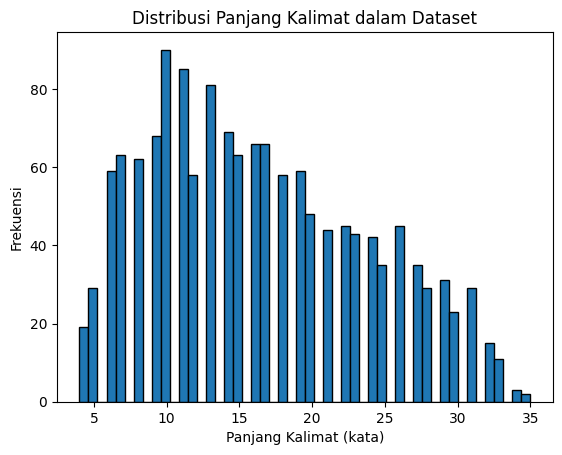

Panjang kalimat yang mencakup 95% dari dataset: 30 kata


In [ ]:
import ast
import matplotlib.pyplot as plt
import numpy as np

file_path = "dataset.txt"  # Ganti dengan path ke file teks Anda

# Mengumpulkan panjang kalimat
sentence_lengths = []

with open(file_path, encoding='utf-8') as topo_file:
    for line in topo_file:
        txt_data = line.split("####")
        sentence = txt_data[0].strip()
        sentence_split = sentence.split()
        sentence_lengths.append(len(sentence_split))

# Plot distribusi panjang kalimat
plt.hist(sentence_lengths, bins=50, edgecolor='k')
plt.xlabel('Panjang Kalimat (kata)')
plt.ylabel('Frekuensi')
plt.title('Distribusi Panjang Kalimat dalam Dataset')
plt.show()

# Menentukan panjang kalimat yang mencakup 95% dari kalimat
max_seq_len = int(np.percentile(sentence_lengths, 95))
print(f"Panjang kalimat yang mencakup 95% dari dataset: {max_seq_len} kata")

anies baswedan: 398
ganjar pranowo: 356
prabowo subianto: 340
muhaimin iskandar: 318
gibran rakabuming: 318
mahfud md: 287


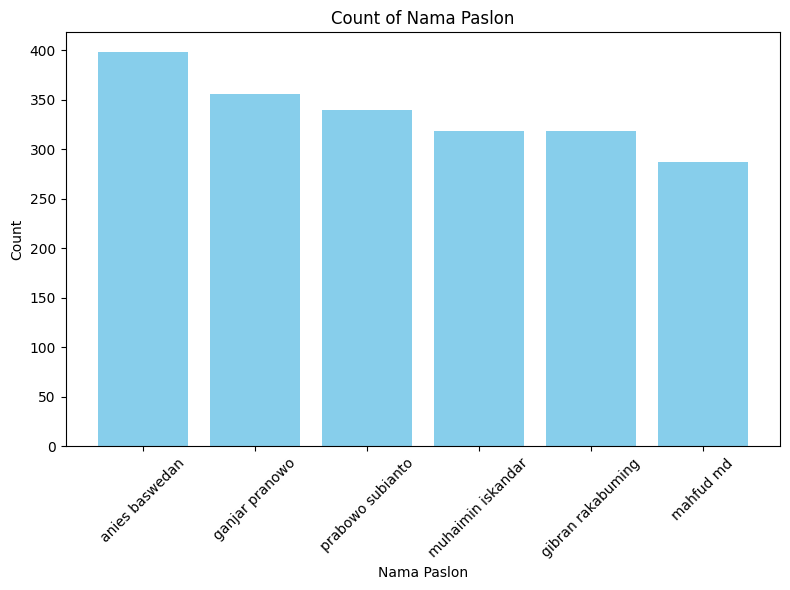

In [ ]:
import json
import matplotlib.pyplot as plt

# # Sample JSON data
# json_data = '''
# {
#   "election_results": {
#     "president": {
#       "nama_paslon": ["John Doe", "Jane Smith", "John Doe", "John Doe", "Jane Smith"]
#     }
#   }
# }
# '''

# Load JSON data
# data = json.loads(json_data)

# Initialize dictionary to store counts
name_counts = {}

# Iterate over each object in the list
for item in data:
    nama_paslon = item["data"]["nama paslon"]
    if nama_paslon in name_counts:
        name_counts[nama_paslon] += 1
    else:
        name_counts[nama_paslon] = 1

# Print the counts
for name, count in name_counts.items():
    print(f"{name}: {count}")

# Extract names and counts for plotting
names = list(name_counts.keys())
counts = list(name_counts.values())

# Plot
plt.figure(figsize=(8, 6))
plt.bar(names, counts, color='skyblue')
plt.xlabel('Nama Paslon')
plt.ylabel('Count')
plt.title('Count of Nama Paslon')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

anies baswedan:
  POS: 744 occurrences
  NEU: 64 occurrences
  NEG: 150 occurrences
ganjar pranowo:
  POS: 390 occurrences
  NEG: 190 occurrences
  NEU: 64 occurrences
prabowo subianto:
  NEG: 220 occurrences
  POS: 435 occurrences
  NEU: 73 occurrences
muhaimin iskandar:
  NEG: 246 occurrences
  NEU: 62 occurrences
  POS: 155 occurrences
gibran rakabuming:
  POS: 259 occurrences
  NEG: 196 occurrences
  NEU: 54 occurrences
mahfud md:
  POS: 280 occurrences
  NEG: 103 occurrences
  NEU: 60 occurrences


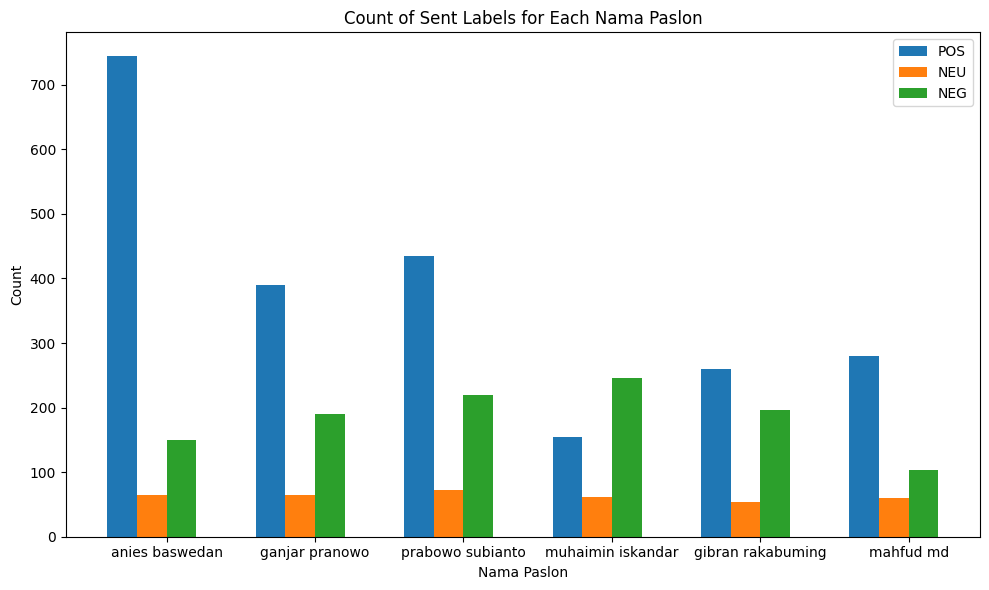

In [ ]:
# Initialize dictionary to store counts
label_counts = {}

# Iterate over each object in the list
for item in data:
    nama_paslon = item["data"]["nama paslon"]
    annotations = item.get("annotations", [])
    for annotation in annotations:
        results = annotation.get("result", [])
        for result in results:
            labels = result.get("labels", [])
            for label in labels:
                if label.startswith("sent:"):
                    label_type = label.split(":")[1]
                    if nama_paslon not in label_counts:
                        label_counts[nama_paslon] = {}
                    label_counts[nama_paslon][label_type] = label_counts[nama_paslon].get(label_type, 0) + 1

# Print the counts
for name, counts in label_counts.items():
    print(f"{name}:")
    for label_type, count in counts.items():
        print(f"  {label_type}: {count} occurrences")

# Extract labels and counts for plotting
labels = list(set(label for counts in label_counts.values() for label in counts.keys()))
nama_paslons = list(label_counts.keys())
counts = {nama_paslon: [label_counts[nama_paslon].get(label, 0) for label in labels] for nama_paslon in nama_paslons}

# Plot
plt.figure(figsize=(10, 6))
bar_width = 0.2
index = range(len(nama_paslons))
for i, label in enumerate(labels):
    plt.bar([x + i * bar_width for x in index], [counts[nama_paslon][i] for nama_paslon in nama_paslons], bar_width, label=label)
plt.xlabel('Nama Paslon')
plt.ylabel('Count')
plt.title('Count of Sent Labels for Each Nama Paslon')
plt.xticks([i + 0.3 for i in index], nama_paslons)
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
pip install wordcloud

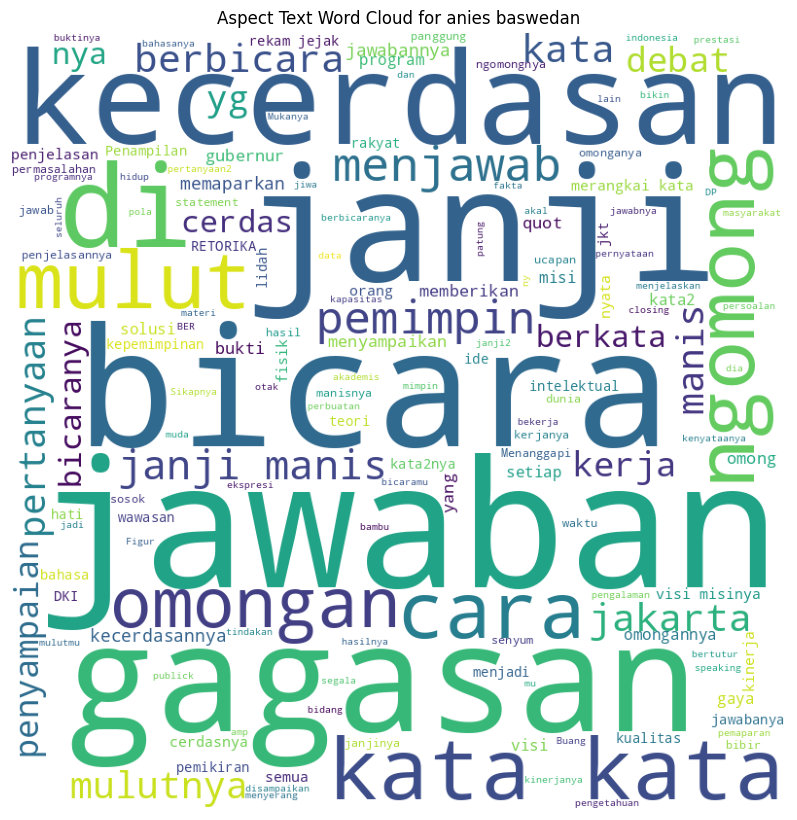

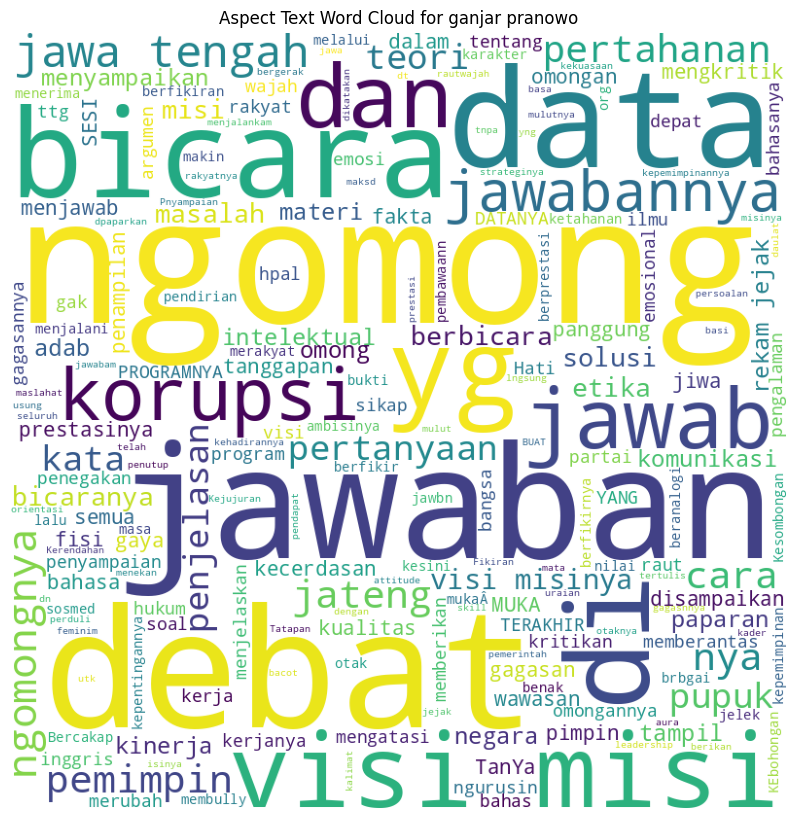

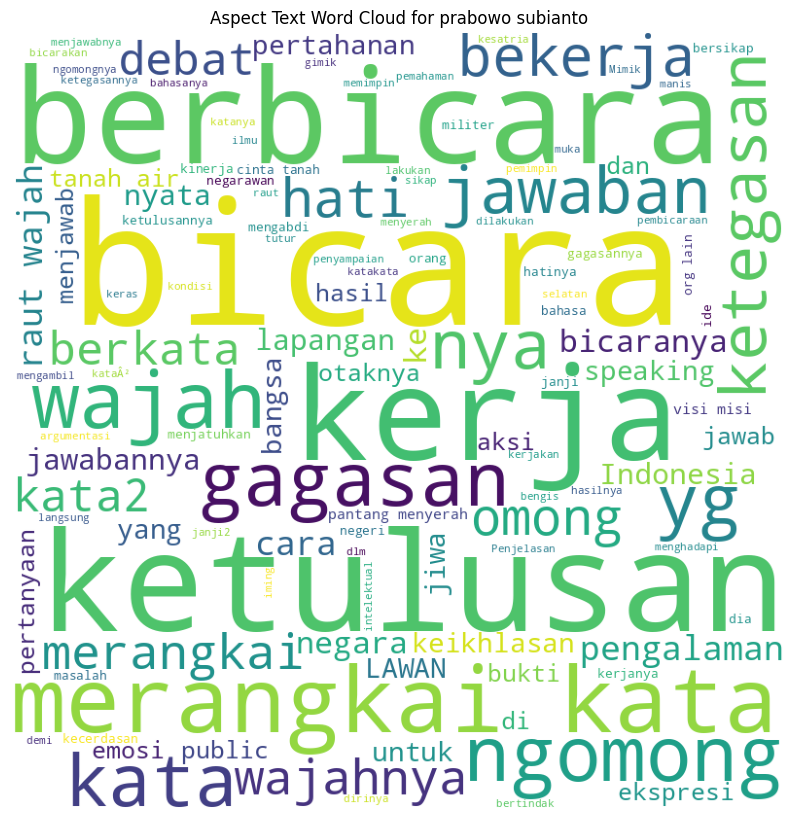

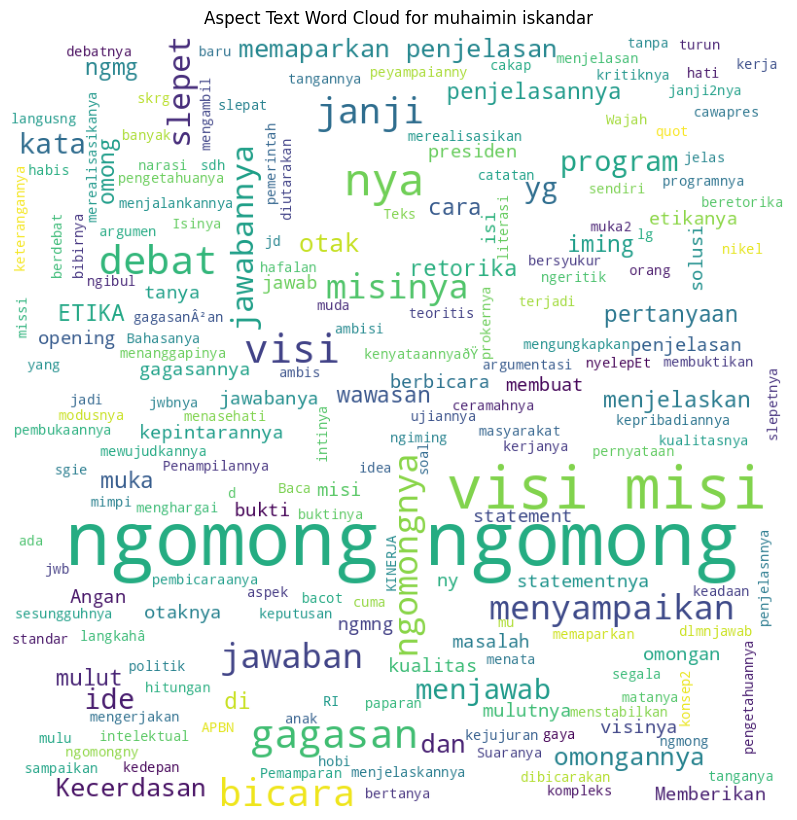

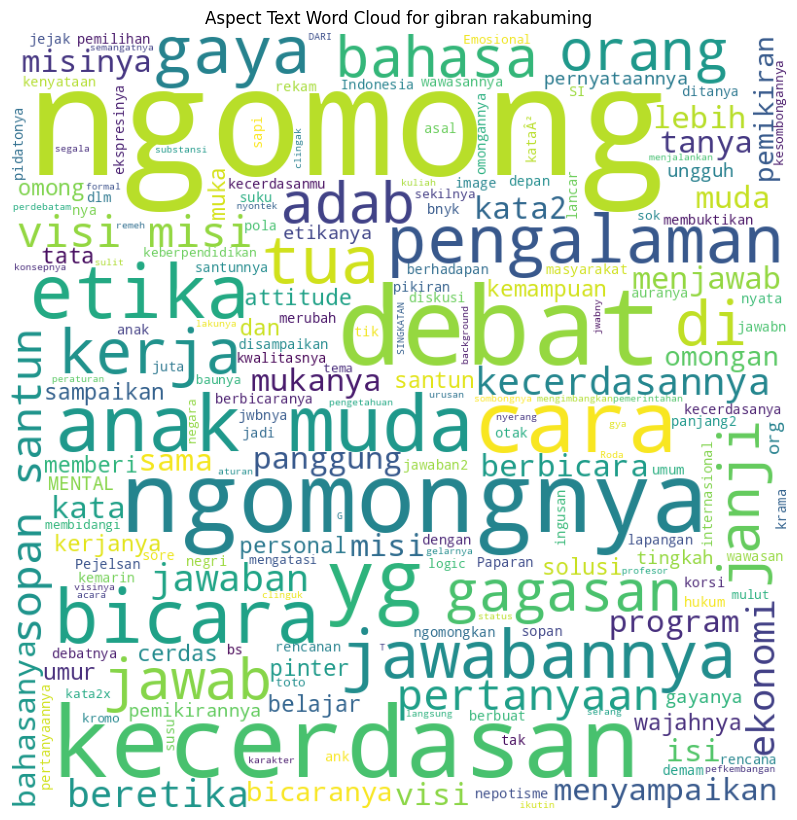

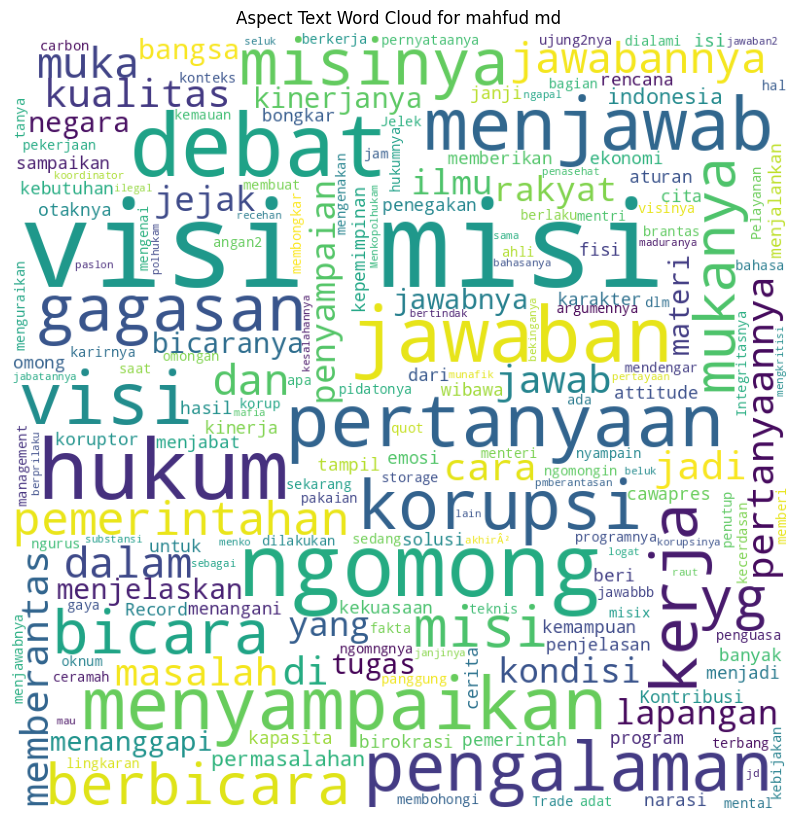

In [ ]:
from wordcloud import WordCloud
# Initialize dictionary to store aspect text for each nama paslon
aspect_texts = {}

# Iterate over each object in the list
for item in data:
    nama_paslon = item["data"]["nama paslon"]
    annotations = item.get("annotations", [])
    aspect_texts[nama_paslon] = aspect_texts.get(nama_paslon, [])
    for annotation in annotations:
        results = annotation.get("result", [])
        for result in results:
            labels = result.get("value", {}).get("labels", [])
            if "Aspect" in labels:
                aspect_text = result.get("value", {}).get("text", "")
                aspect_texts[nama_paslon].append(aspect_text)

# Generate word clouds for aspect text
for nama_paslon, texts in aspect_texts.items():
    aspect_text = ' '.join(texts)
    wordcloud = WordCloud(width=800, height=800,
                          background_color='white',
                          min_font_size=10).generate(aspect_text)

    # Plot word cloud
    plt.figure(figsize=(8, 8), facecolor=None)
    plt.imshow(wordcloud)
    plt.title(f'Aspect Text Word Cloud for {nama_paslon}')
    plt.axis("off")
    plt.tight_layout(pad=0)

    plt.show()

Streaming output truncated to the last 5000 lines.
Count for result_gibran.json: 13503
Count for result_imin.json: 3725
Count for result_mahfud.json: 3164


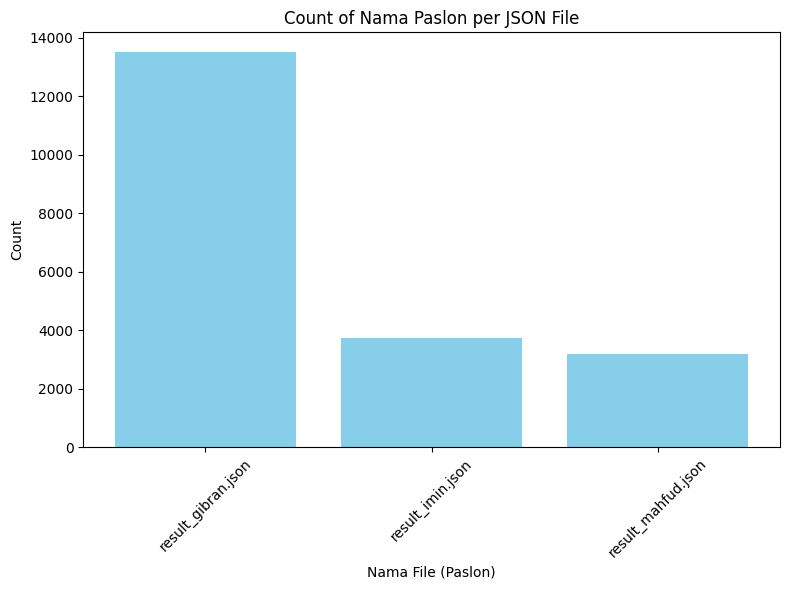

In [ ]:
import json
import matplotlib.pyplot as plt

# Replace with the actual paths to your JSON files
filenames = ["result_gibran.json", "result_imin.json", "result_mahfud.json"]

# Initialize dictionaries to store counts
name_counts = {}
file_counts = {}

# Iterate over each JSON file
# for filename in filenames:
#     # Open the JSON file
#     with open(filename, 'r') as f:
#         # Load data from the file
#         data = json.load(f)

#     # Initialize count for this file
#     file_counts[filename] = 0

#     # Iterate over each object in the list within the data
#     for item in data:
#         # Handle missing "data" key (choose Option 1 or Option 2)
#         # Option 1 (Recommended): Check for "data" key
#         if "data" in item:
#             nama_paslon = item["data"]["nama paslon"]
#             name_counts[nama_paslon] = name_counts.get(nama_paslon, 0) + 1
#         else:
#             print(f"Warning: Item missing 'data' key in {filename}: {item}")

#         # Option 2 (Assuming no "data" key):
#         # try:
#         #     nama_paslon = item["nama_paslon"]
#         #     name_counts[nama_paslon] = name_counts.get(nama_paslon, 0) + 1
#         # except KeyError:
#         #     print(f"Warning: Item missing 'nama_paslon' key in {filename}: {item}")

#         # Increment count for this file
#         file_counts[filename] += 1

# Print counts per file
for filename, count in file_counts.items():
    print(f"Count for {filename}: {count}")

# Plot
plt.figure(figsize=(8, 6))
plt.bar(filenames, list(file_counts.values()), color='skyblue')
plt.xlabel('Nama File (Paslon)')  # More descriptive label
plt.ylabel('Count')
plt.title('Count of Nama Paslon per JSON File')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
import ast
from collections import defaultdict, Counter
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Function to read and process the output file
def process_output_file(filename):
    candidate_sentiments = defaultdict(lambda: {'POS': 0, 'NEU': 0, 'NEG': 0})
    candidate_aspects = defaultdict(list)
    candidate_opinions = defaultdict(lambda: defaultdict(list))

    with open(filename, "r", encoding="utf-8") as file:
        for line in file:
            txt_data = line.split("####")
            name_candidates = txt_data[0].strip()
            preprocessed_sentence = txt_data[1].strip()
            res = ast.literal_eval(txt_data[2].strip())

            for relation in res:
                sentiment = relation[2]  # Sentiment is at index 2 in each relation tuple
                aspect_indices = relation[0]  # Aspect indices are at index 0 in each relation tuple
                opinion_indices = relation[1]  # Opinion indices are at index 1 in each relation tuple

                # Extract aspect and opinion words based on indices
                aspect_words = [preprocessed_sentence.split()[i] for i in aspect_indices]
                opinion_words = [preprocessed_sentence.split()[i] for i in opinion_indices]

                aspect_phrase = ' '.join(aspect_words)
                opinion_phrase = ' '.join(opinion_words)

                candidate_sentiments[name_candidates][sentiment] += 1
                candidate_aspects[name_candidates].append(aspect_phrase)
                candidate_opinions[name_candidates][aspect_phrase].append(opinion_phrase)

    return candidate_sentiments, candidate_aspects, candidate_opinions


# Function to plot sentiment comparison for each candidate
def plot_sentiment_comparison(candidate_sentiments):
    candidates = list(candidate_sentiments.keys())
    pos_counts = [candidate_sentiments[c]['POS'] for c in candidates]
    neu_counts = [candidate_sentiments[c]['NEU'] for c in candidates]
    neg_counts = [candidate_sentiments[c]['NEG'] for c in candidates]

    x = np.arange(len(candidates))  # the label locations
    width = 0.25  # the width of the bars

    fig, ax = plt.subplots(figsize=(12, 8))
    rects1 = ax.bar(x - width, pos_counts, width, label='Positive', color='g')
    rects2 = ax.bar(x, neu_counts, width, label='Neutral', color='y')
    rects3 = ax.bar(x + width, neg_counts, width, label='Negative', color='r')

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_xlabel('Candidates')
    ax.set_ylabel('Sentiment Counts')
    ax.set_title('Sentiment Comparison for Each Candidate')
    ax.set_xticks(x)
    ax.set_xticklabels(candidates, rotation='vertical')
    ax.legend()

    fig.tight_layout()
    plt.show()

# Function to create and display wordcloud for each candidate's aspects
def create_wordcloud(candidate_aspects):
    for candidate, aspects in candidate_aspects.items():
        text = ' '.join(aspects)
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f'WordCloud for Candidate: {candidate}')
        plt.axis('off')
        plt.show()

# Function to plot top 10 aspects for each candidate
def plot_top_aspects(candidate_aspects):
    for candidate, aspects in candidate_aspects.items():
        aspect_counts = Counter(aspects)
        top_aspects = aspect_counts.most_common(10)

        labels, values = zip(*top_aspects)
        x = np.arange(len(labels))

        plt.figure(figsize=(12, 8))
        plt.bar(x, values)
        plt.xlabel('Aspects')
        plt.ylabel('Frequency')
        plt.title(f'Top 10 Aspects for Candidate: {candidate}')
        plt.xticks(x, labels, rotation='vertical')
        plt.tight_layout()
        plt.show()

# Function to plot top 10 aspects for a specific candidate
def plot_top_aspects_candidates(candidate_aspects, target_candidate):
    aspects = candidate_aspects[target_candidate]
    aspect_counts = Counter(aspects)
    top_aspects = aspect_counts.most_common(10)

    labels, values = zip(*top_aspects)
    x = np.arange(len(labels))

    plt.figure(figsize=(12, 8))
    plt.bar(x, values)
    plt.xlabel('Aspects')
    plt.ylabel('Frequency')
    plt.title(f'Top 10 Aspects for Candidate: {target_candidate}')
    plt.xticks(x, labels, rotation='vertical')
    plt.tight_layout()
    plt.show()

    return [aspect[0] for aspect in top_aspects]  # Return the list of top aspects

# Function to create wordcloud for opinions from a specific aspect (general)
def create_wordcloud_for_aspect(candidate_opinions, target_aspect):
    opinions = []
    for aspect_opinions in candidate_opinions.values():
        if target_aspect in aspect_opinions:
            opinions.extend(aspect_opinions[target_aspect])

    text = ' '.join(opinions)
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'WordCloud for Opinions on Aspect: {target_aspect}')
    plt.axis('off')
    plt.show()

# Function to create wordcloud for opinions from a specific aspect for each candidate
def create_wordcloud_for_aspect_per_candidate_all(candidate_opinions, target_aspect):
    for candidate, aspect_opinions in candidate_opinions.items():
        if target_aspect in aspect_opinions:
            opinions = aspect_opinions[target_aspect]
            text = ' '.join(opinions)
            wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

            plt.figure(figsize=(10, 5))
            plt.imshow(wordcloud, interpolation='bilinear')
            plt.title(f'WordCloud for {candidate} - Opinions on Aspect: {target_aspect}')
            plt.axis('off')
            plt.show()

def create_wordcloud_for_top_aspects(candidate_opinions, top_aspects, target_candidate):
    for aspect in top_aspects:
        create_wordcloud_for_aspect_per_candidate(candidate_opinions, aspect, target_candidate)


# Process the output file and get the candidate sentiment data and aspects
filename = 'EDA_personal.txt'
candidate_sentiments, candidate_aspects, candidate_opinions = process_output_file(filename)


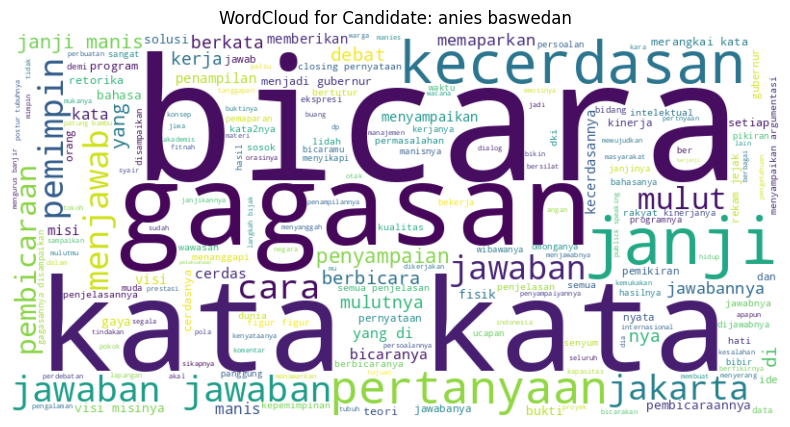

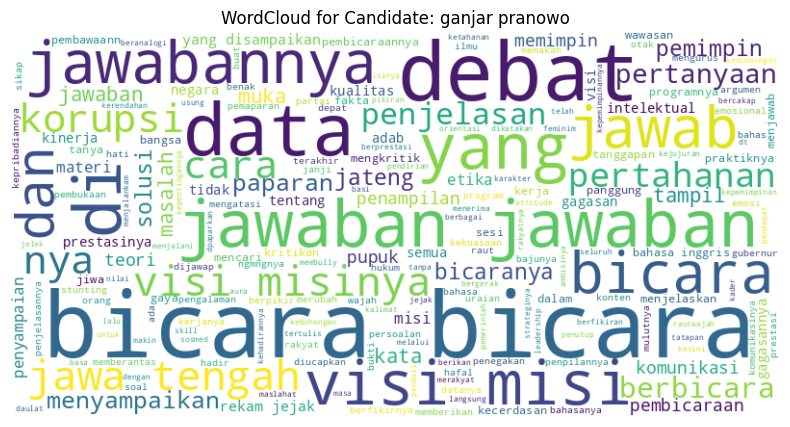

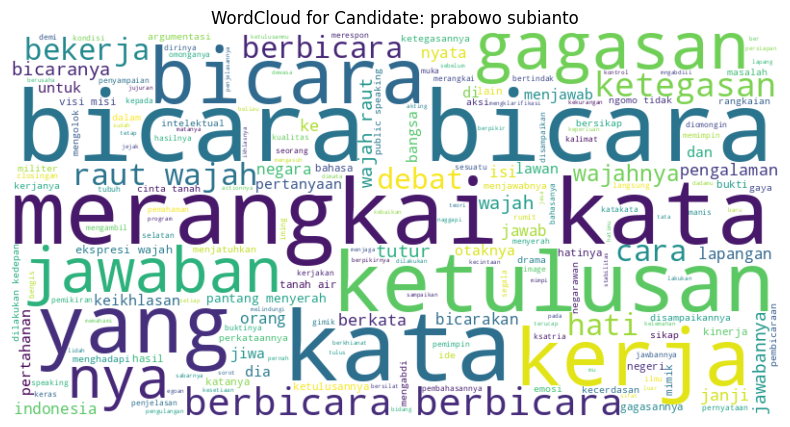

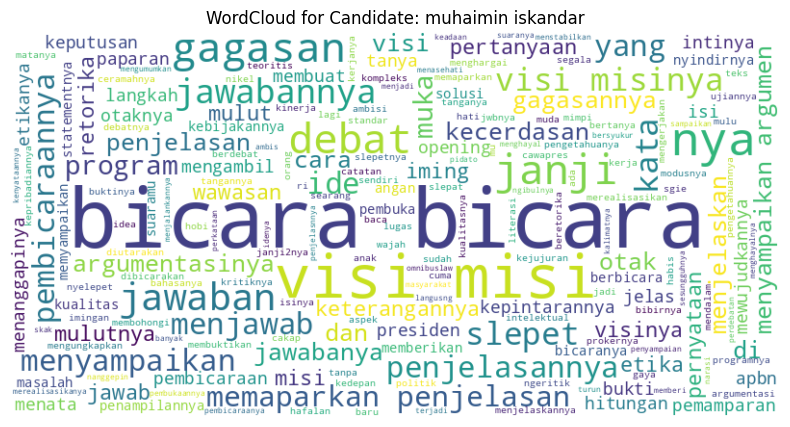

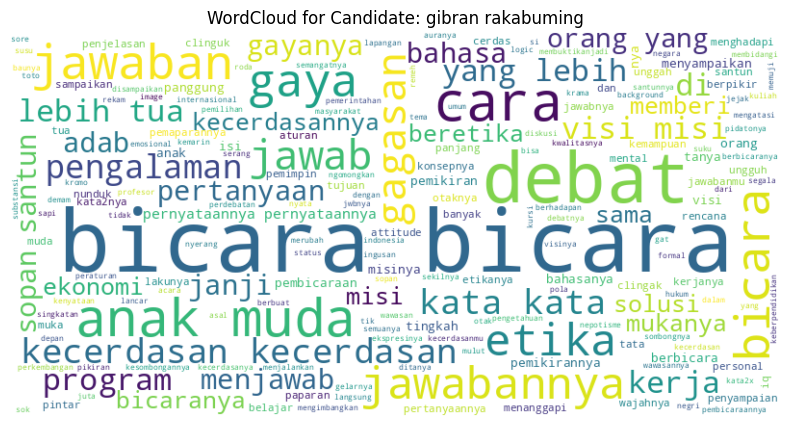

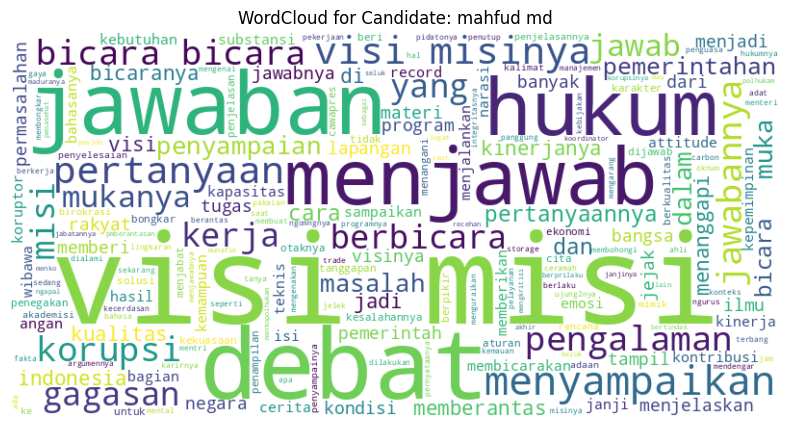

In [ ]:
# Create and display wordcloud for each candidate's aspects
create_wordcloud(candidate_aspects)

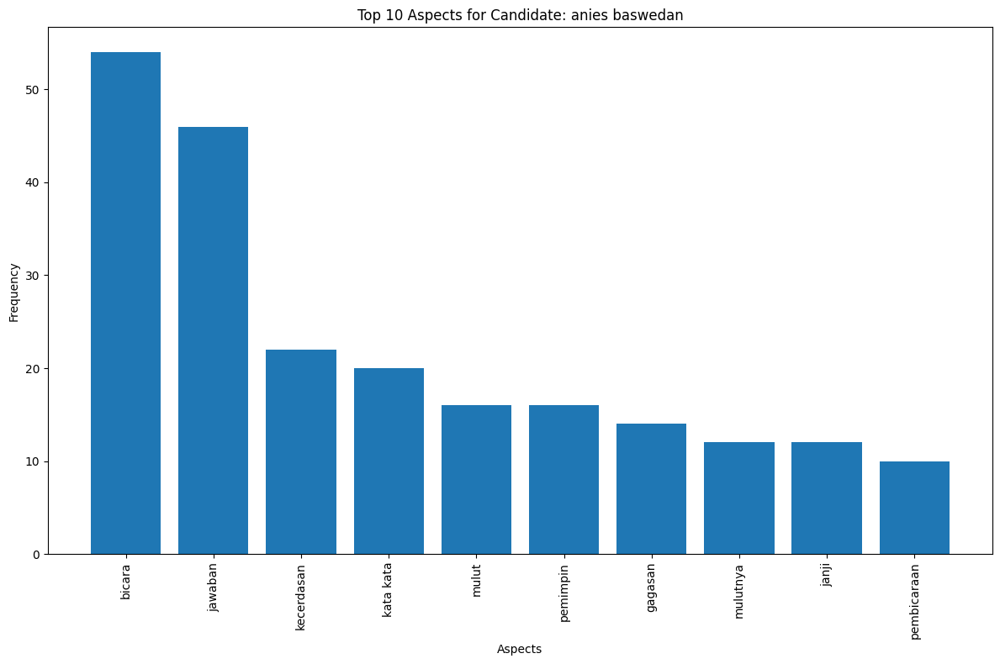

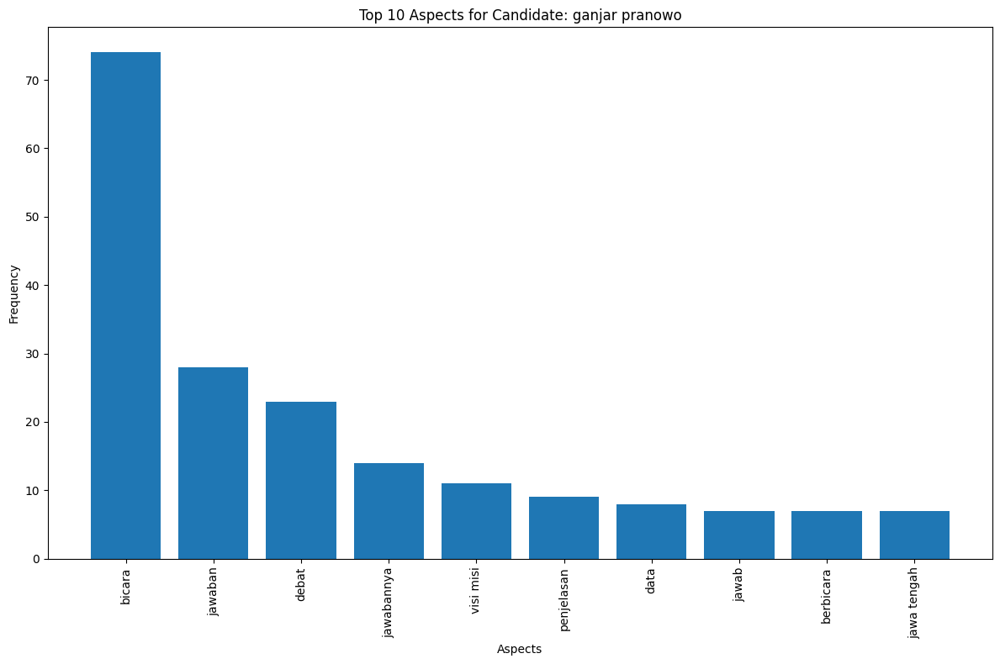

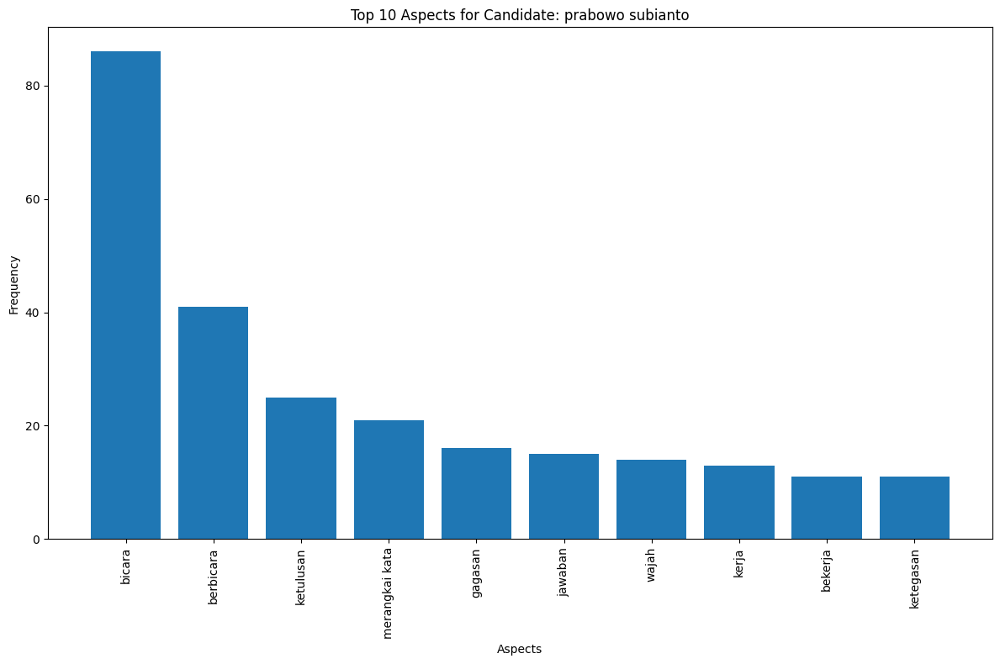

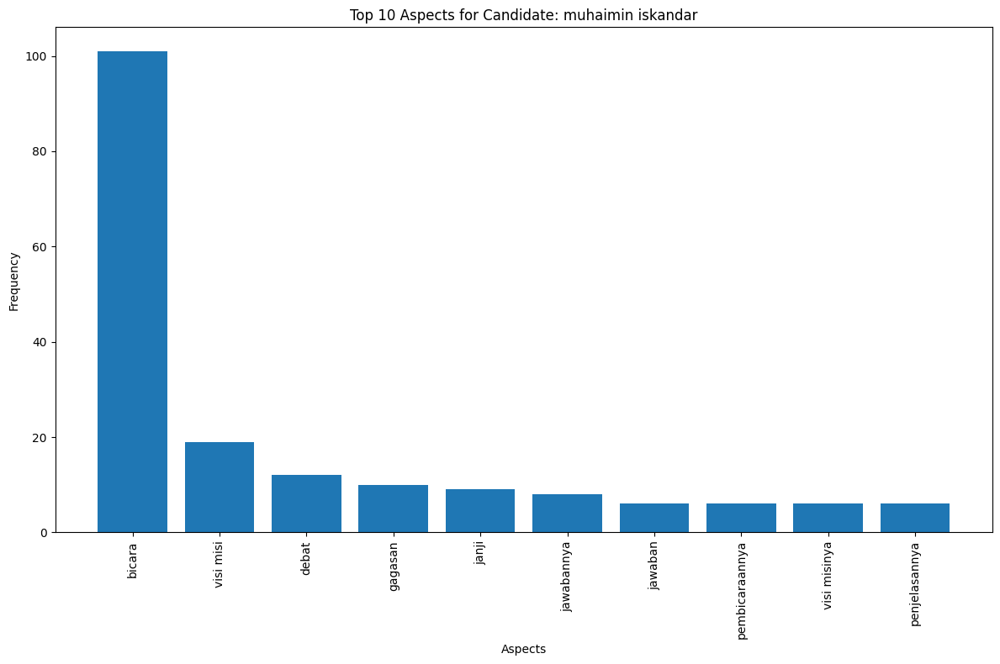

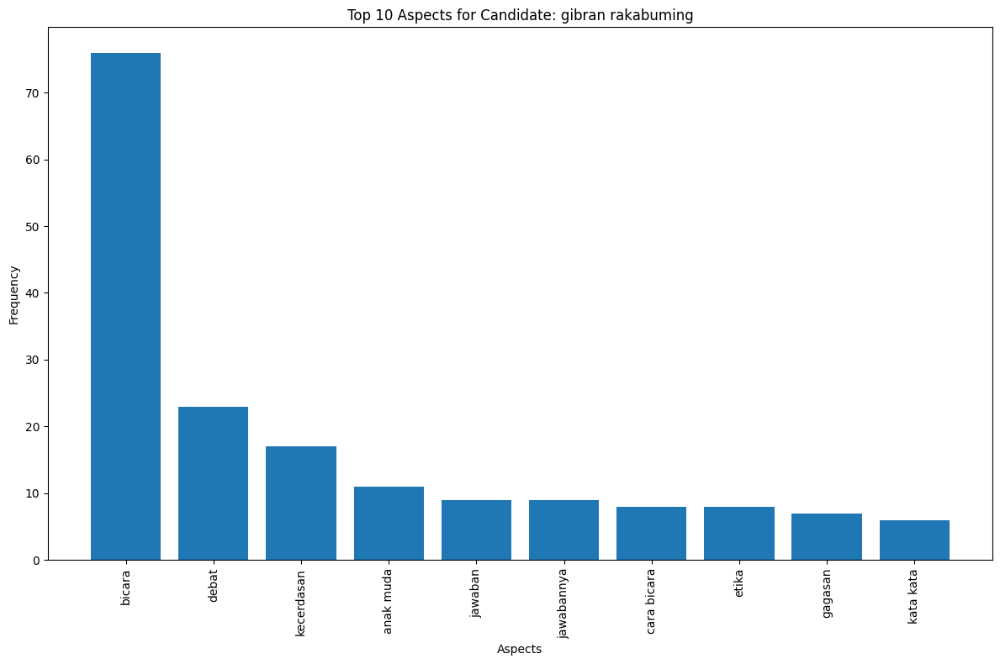

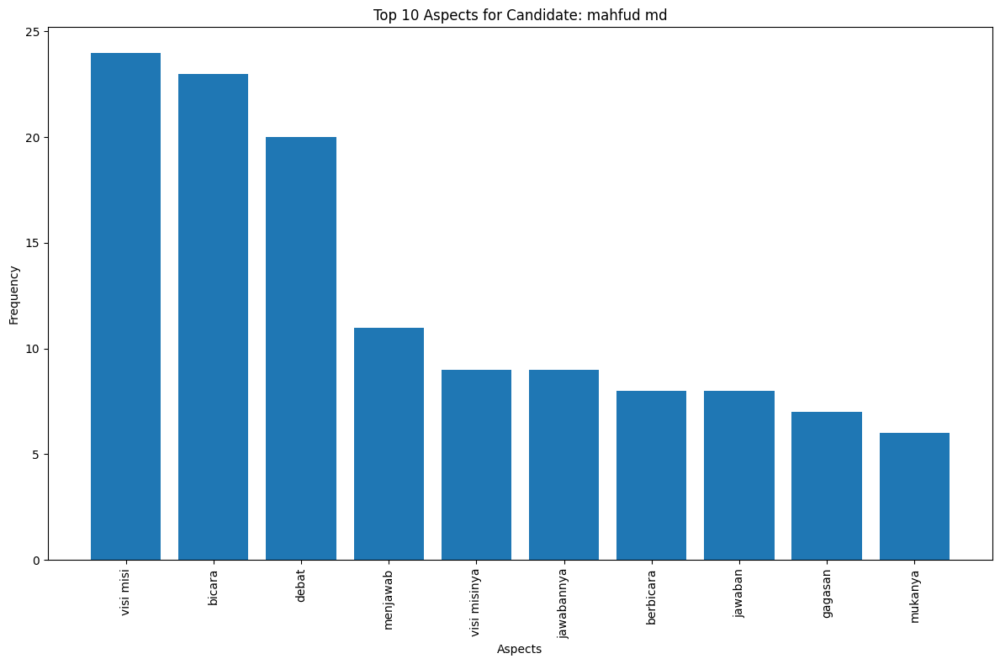

In [ ]:
# Plot top 5 aspects for each candidate
plot_top_aspects(candidate_aspects)

In [ ]:
target_candidate = 'ganjar pranowo'  # Change this to the desired candidate name ["anies baswedan", "prabowo subianto", "ganjar pranowo", "muhaimin iskandar", "gibran rakabuming", "mahfud md"]

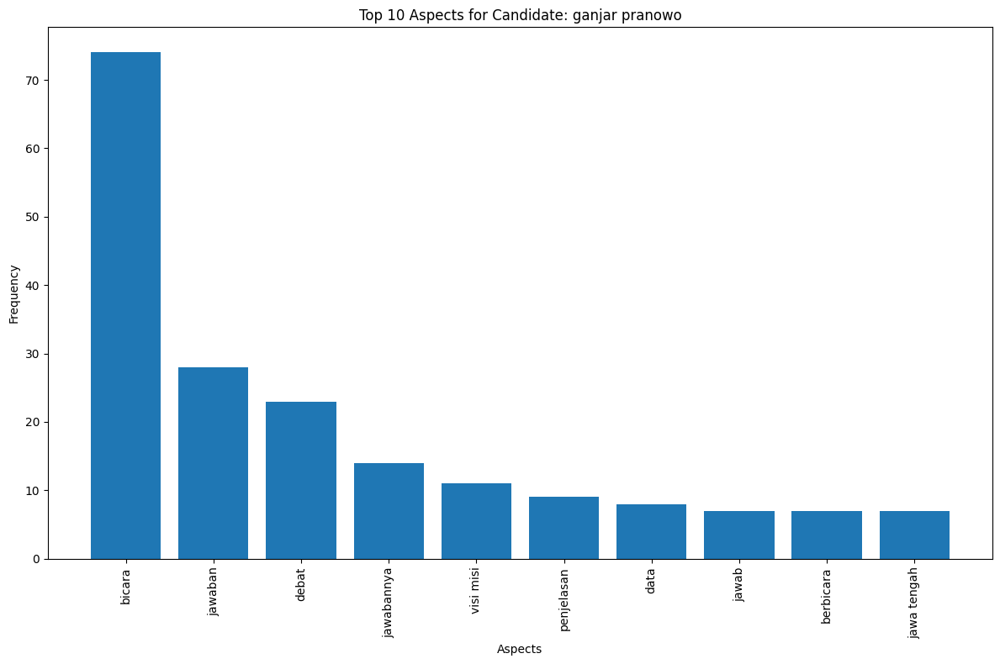

In [ ]:
# Plot top 10 aspects for the target candidate
top_aspect = plot_top_aspects_candidates(candidate_aspects, target_candidate)

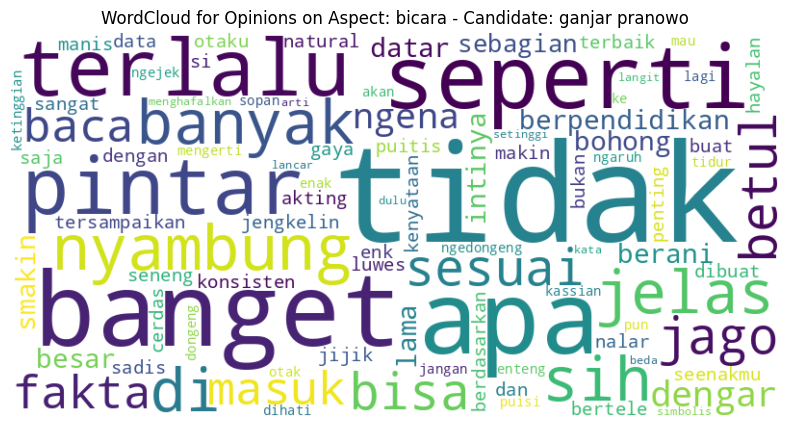

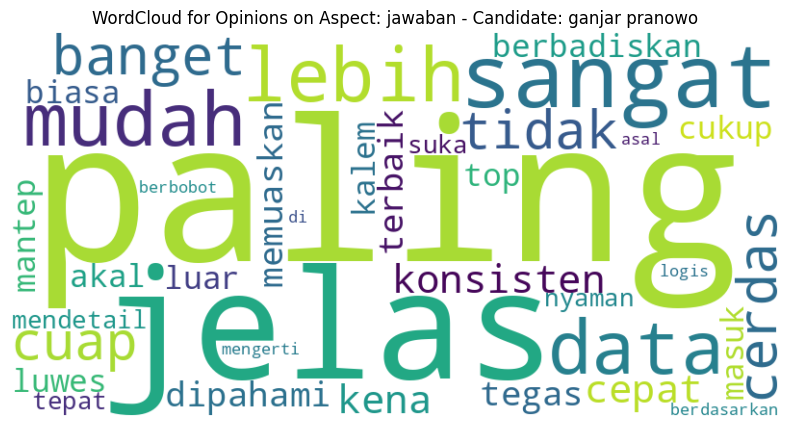

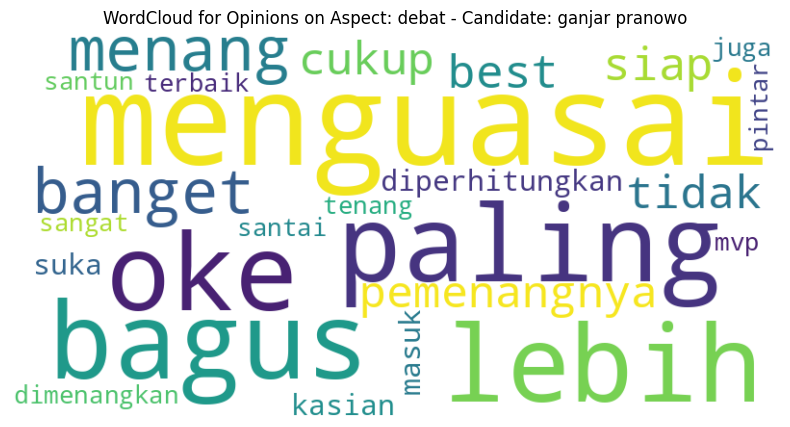

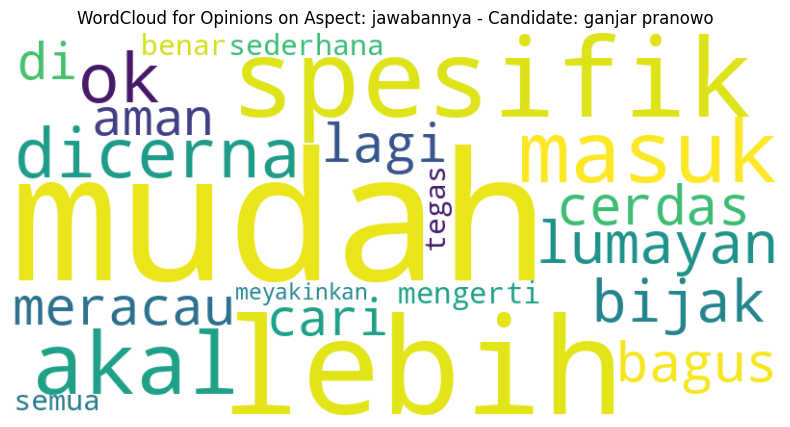

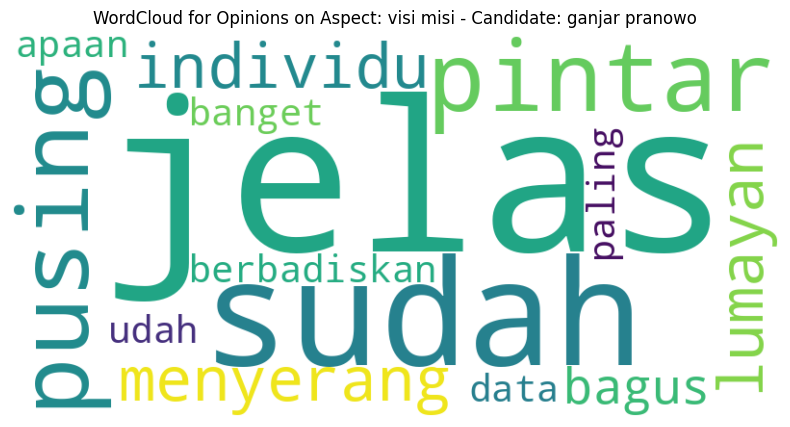

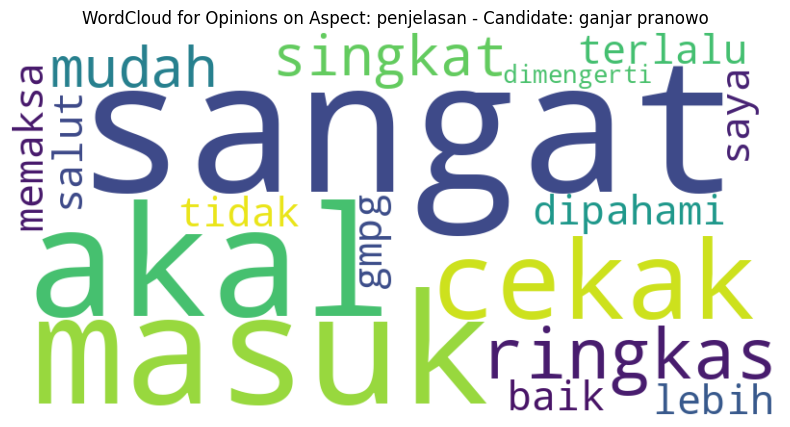

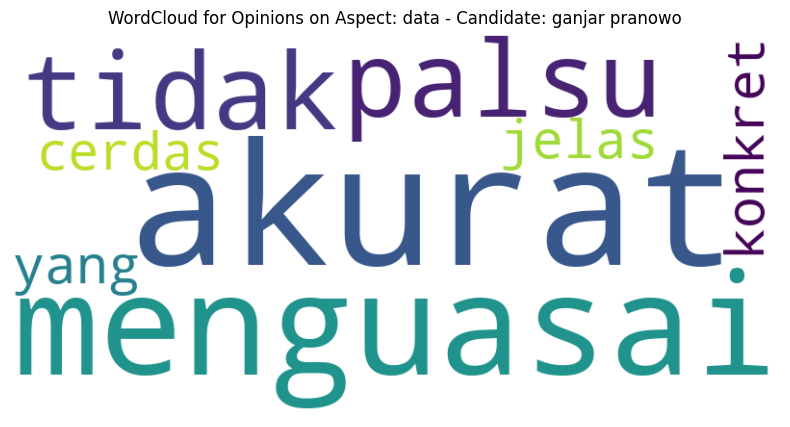

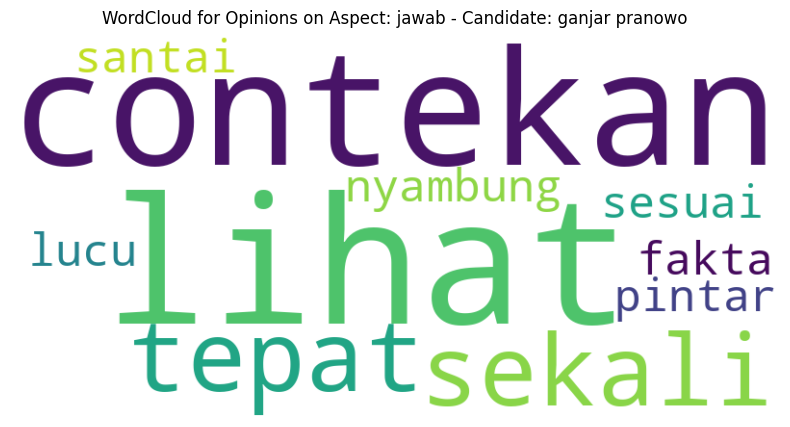

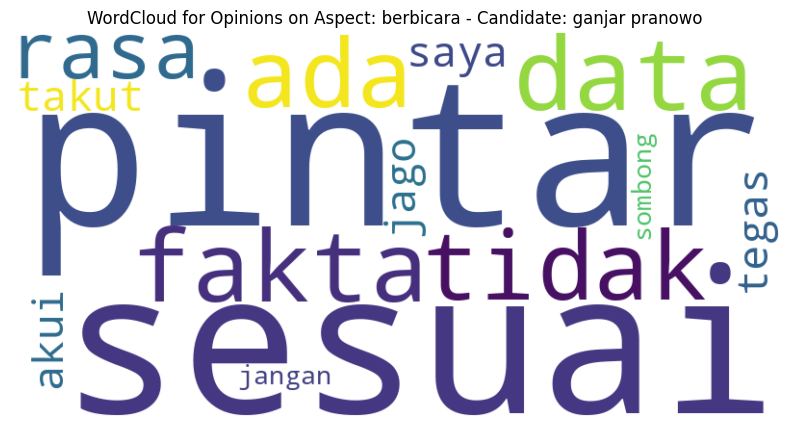

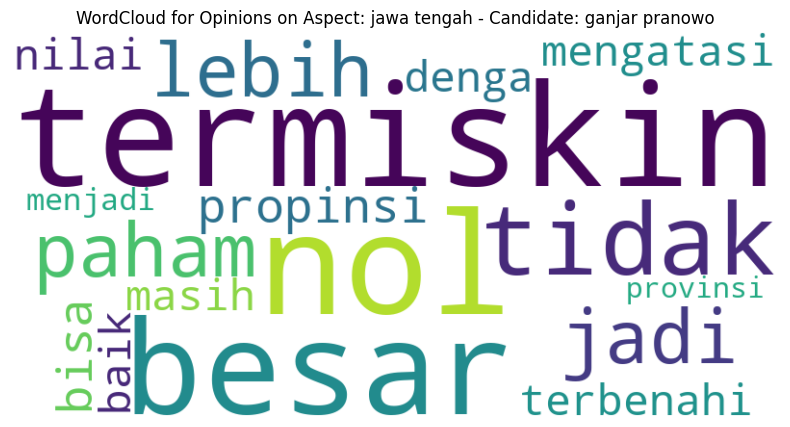

In [ ]:
create_wordcloud_for_top_aspects(candidate_opinions, top_aspect, target_candidate)

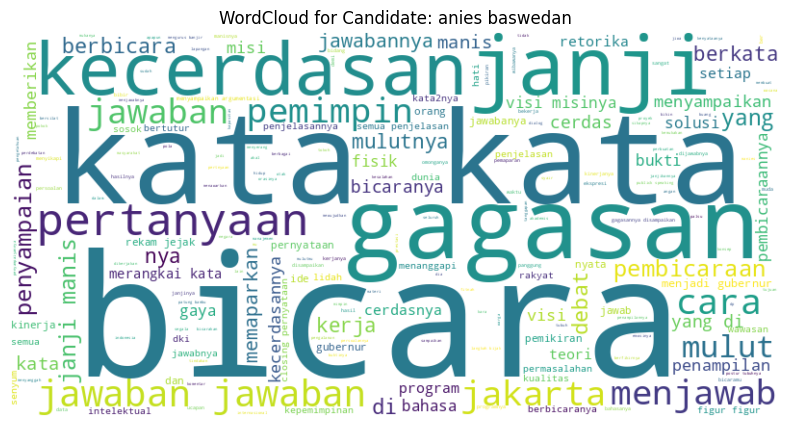

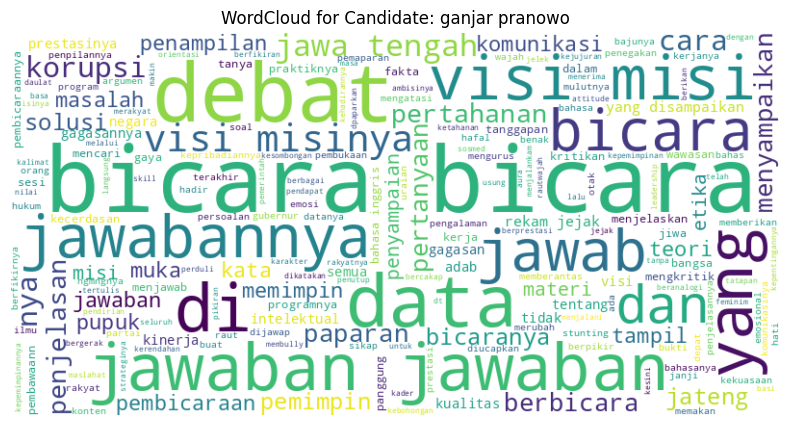

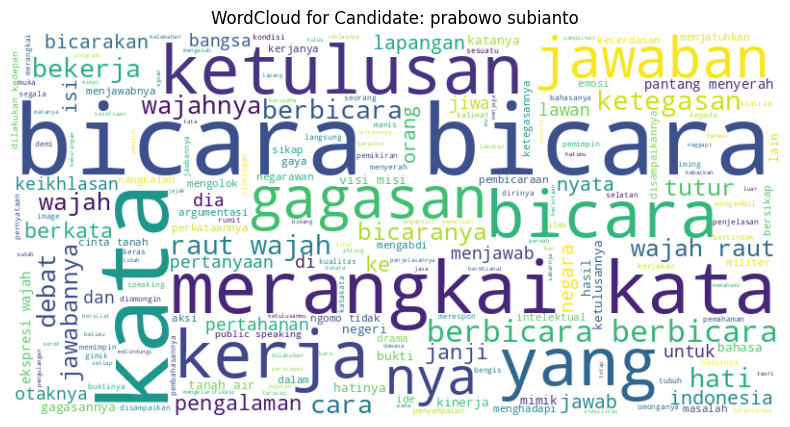

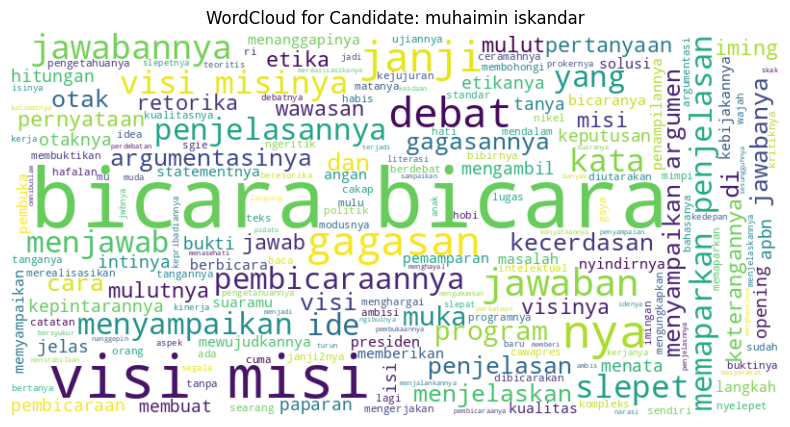

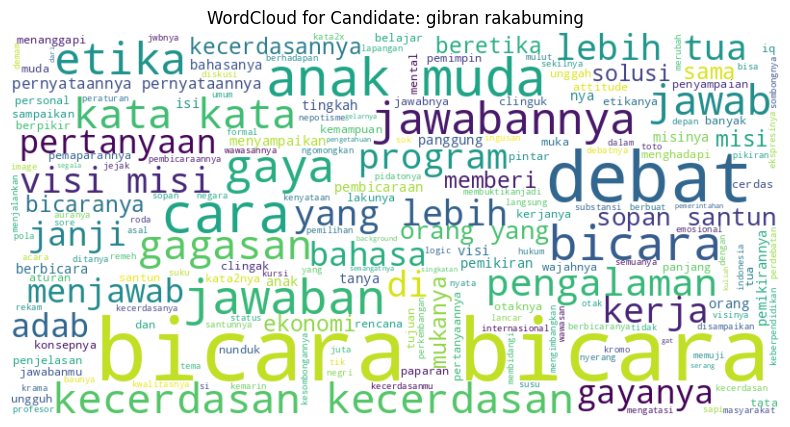

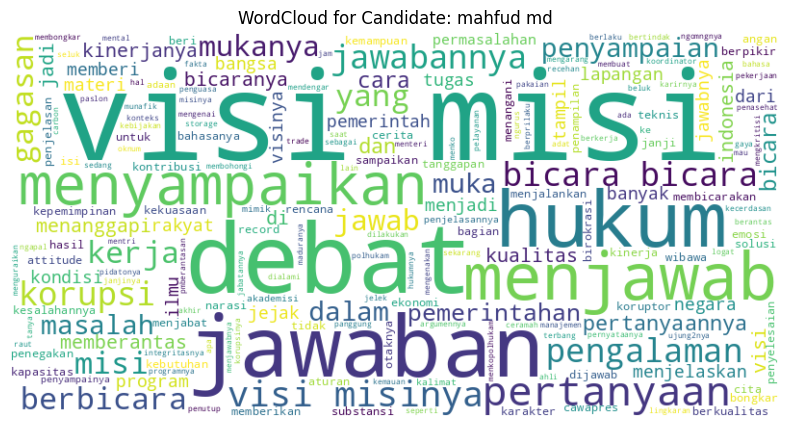

In [ ]:
create_wordcloud(candidate_aspects)

In [ ]:
import pandas as pd

In [ ]:
n = pd.read_json('project-3-at-2024-06-02-19-45-84568af4.json')
n

,id,annotations,file_upload,drafts,predictions,data,meta,created_at,updated_at,inner_id,total_annotations,cancelled_annotations,total_predictions,comment_count,unresolved_comment_count,last_comment_updated_at,project,updated_by,comment_authors
0,2309,"[{'id': 136, 'completed_by': 2, 'result': [{'v...",f63e09c6-scenario2_individu_capres.csv,[],[],{'text': 'Nies anies yg kamu robah itu opo nie...,{},2024-05-16 07:35:26.289426+00:00,2024-05-24 12:18:02.868986+00:00,1,1,0,0,0,0,NaT,3,2,[]
1,2310,"[{'id': 137, 'completed_by': 2, 'result': [{'v...",f63e09c6-scenario2_individu_capres.csv,"[{'id': 1043, 'user': 'nazriyah.tsaniyah1203@g...",[],{'text': 'Jangan pernah percaya lagi dengan om...,{},2024-05-16 07:35:26.289426+00:00,2024-05-21 08:09:12.888660+00:00,2,1,0,0,0,0,NaT,3,2,[]
2,2311,"[{'id': 138, 'completed_by': 2, 'result': [{'v...",f63e09c6-scenario2_individu_capres.csv,[],[],{'text': 'Si Anis ni sangat pandai bicara dn b...,{},2024-05-16 07:35:26.289426+00:00,2024-05-21 08:09:35.390140+00:00,3,1,0,0,0,0,NaT,3,2,[]
3,2312,"[{'id': 139, 'completed_by': 2, 'result': [{'v...",f63e09c6-scenario2_individu_capres.csv,[],[],{'text': 'Manis kata buktingak ada anis waktu ...,{},2024-05-16 07:35:26.289426+00:00,2024-05-21 08:10:23.925846+00:00,4,1,0,0,0,0,NaT,3,2,[]
4,2313,"[{'id': 140, 'completed_by': 2, 'result': [{'v...",f63e09c6-scenario2_individu_capres.csv,[],[],{'text': 'Anies mulutnya manis dan janjinyan p...,{},2024-05-16 07:35:26.289426+00:00,2024-05-21 08:10:44.306513+00:00,5,1,0,0,0,0,NaT,3,2,[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012,4374,"[{'id': 4469, 'completed_by': 2, 'result': [{'...",9f25617f-scenario2_individu_cawapres.csv,[],[],{'text': 'MF saya PILIH MAHMUD MD KARNA tau hu...,{},2024-05-27 10:15:04.272231+00:00,2024-05-31 13:45:06.149286+00:00,2066,1,0,0,0,0,NaT,3,2,[]
2013,4375,"[{'id': 4468, 'completed_by': 2, 'result': [{'...",9f25617f-scenario2_individu_cawapres.csv,[],[],{'text': 'Pak Mahmud paparan dan pertanyaannya...,{},2024-05-27 10:15:04.272231+00:00,2024-05-31 13:44:44.890051+00:00,2067,1,0,0,0,0,NaT,3,2,[]
2014,4376,"[{'id': 4467, 'completed_by': 2, 'result': [{'...",9f25617f-scenario2_individu_cawapres.csv,[],[],{'text': 'Memang kelihatan yang berpengalaman ...,{},2024-05-27 10:15:04.273161+00:00,2024-05-31 13:44:19.714728+00:00,2068,1,0,0,0,0,NaT,3,2,[]
2015,4377,"[{'id': 4466, 'completed_by': 2, 'result': [{'...",9f25617f-scenario2_individu_cawapres.csv,[],[],"{'text': 'Jawaban Mahmud MD,bukan menjawab tap...",{},2024-05-27 10:15:04.273161+00:00,2024-05-31 13:43:44.492158+00:00,2069,1,0,0,0,0,NaT,3,2,[]


In [ ]:
index, annotations, text = [], [], []

for idx, row in n.iterrows():
    index.append(idx)
    annotations.append(row['annotations'])
    text.append(row['data']['text'])

yt_comments = pd.DataFrame({'annotations': annotations, 'comment':  text }, index=index)
yt_comments

,annotations,comment
0,"[{'id': 136, 'completed_by': 2, 'result': [{'v...",Nies anies yg kamu robah itu opo nies anies r...
1,"[{'id': 137, 'completed_by': 2, 'result': [{'v...",Jangan pernah percaya lagi dengan omongan Anis...
2,"[{'id': 138, 'completed_by': 2, 'result': [{'v...",Si Anis ni sangat pandai bicara dn berjanji ma...
3,"[{'id': 139, 'completed_by': 2, 'result': [{'v...",Manis kata buktingak ada anis waktu djakarta a...
4,"[{'id': 140, 'completed_by': 2, 'result': [{'v...",Anies mulutnya manis dan janjinyan palsu semua.
...,...,...
2012,"[{'id': 4469, 'completed_by': 2, 'result': [{'...",MF saya PILIH MAHMUD MD KARNA tau hukum dan da...
2013,"[{'id': 4468, 'completed_by': 2, 'result': [{'...",Pak Mahmud paparan dan pertanyaannya paling ma...
2014,"[{'id': 4467, 'completed_by': 2, 'result': [{'...",Memang kelihatan yang berpengalaman dan tdk as...
2015,"[{'id': 4466, 'completed_by': 2, 'result': [{'...","Jawaban Mahmud MD,bukan menjawab tapi jadi ber..."


In [ ]:
import random

# Kamus sinonim
synonym_dict = {
    "maklumat": {
        "tag": "n",
        "sinonim": [
            "amanat",
            "butir-butir",
            "deklarasi",
            "embaran",
            "informasi",
            "kabar",
            "kenyataan",
            "keterangan",
            "laporan",
            "makrifat",
            "manifesto",
            "mualamat",
            "pemberitaan",
            "pemberitahuan",
            "pengetahuan",
            "pengumuman",
            "permakluman",
            "pesiaran",
            "proklamasi",
            "publikasi",
            "siaran",
            "takrif",
            "wara-wara",
            "warta"
        ]
    },
    "reformasi": {
        "tag": "n",
        "sinonim": [
            "pembaruan",
            "perbaikan",
            "perombakan",
            "restorasi"
        ]
    }
}

def augment_sentence(sentence):
    words = sentence.split()
    new_words = []
    for word in words:
        synonym_found = False
        for key, value in synonym_dict.items():
            if word in value['sinonim']:
                synonyms_for_word = [synonym for synonym in value['sinonim'] if synonym != word]
                if synonyms_for_word:
                    new_word = random.choice(synonyms_for_word)
                    new_words.append(new_word)
                else:
                    new_words.append(word)
                synonym_found = True
                break
        if not synonym_found:
            new_words.append(word)
    return ' '.join(new_words)

# Contoh penggunaan
sentence = "restorasi penting harus disampaikan kepada masyarakat."
augmented_sentence = augment_sentence(sentence)
print("Original sentence:", sentence)
print("Augmented sentence:", augmented_sentence)


Original sentence: restorasi penting harus disampaikan kepada masyarakat.
Augmented sentence: perbaikan penting harus disampaikan kepada masyarakat.


In [ ]:
import random
import ast

# Data asli
data = ["si anis ni sangat pandai bicara dan berjanji manis namun pelaksanaan nol .####[[[5], [3, 4], 'POS'], [[7, 8], [3, 4], 'POS'], [[10], [11], 'NEG']]"]

def group_consecutive_indices(indices):
    """Group consecutive indices together."""
    if not indices:
        return []
    grouped = [[indices[0]]]
    for i in range(1, len(indices)):
        if indices[i] == indices[i-1] + 1:
            grouped[-1].append(indices[i])
        else:
            grouped.append([indices[i]])
    return grouped

def shuffle_tokens(sentence, annotations):
    words = sentence.split()
    indices = list(range(len(words)))

    # Group consecutive indices in annotations
    grouped_indices = []
    used_indices = set()
    for aspect_indices, opinion_indices, _ in annotations:
        all_indices = aspect_indices + opinion_indices
        all_indices = sorted(set(all_indices))  # Remove duplicates and sort
        for group in group_consecutive_indices(all_indices):
            if any(idx not in used_indices for idx in group):
                grouped_indices.append(group)
                used_indices.update(group)

    remaining_indices = [i for i in indices if i not in used_indices]
    grouped_indices.extend([[i] for i in remaining_indices])

    # Shuffle groups
    random.shuffle(grouped_indices)

    # Flatten the groups to get the new order
    shuffled_indices = [idx for group in grouped_indices for idx in group]
    shuffled_words = [words[idx] for idx in shuffled_indices]

    # Reconstruct the sentence and update indices
    word_index_map = {old_idx: new_idx for new_idx, old_idx in enumerate(shuffled_indices)}

    new_annotations = []
    for aspect_indices, opinion_indices, sentiment in annotations:
        new_aspect_indices = sorted(word_index_map[idx] for idx in aspect_indices)
        new_opinion_indices = sorted(word_index_map[idx] for idx in opinion_indices)
        new_annotations.append([new_aspect_indices, new_opinion_indices, sentiment])

    return ' '.join(shuffled_words), new_annotations

def augment_data(data):
    augmented_data = []
    for line in data:
        txt_data = line.strip().split("####")
        sentence = txt_data[0].strip()
        annotations = ast.literal_eval(txt_data[1])
        new_sentence, new_annotations = shuffle_tokens(sentence, annotations)
        augmented_data.append(f"{new_sentence}####{new_annotations}")
    return augmented_data

# Augment data
augmented_data = augment_data(data)

# Print augmented data
for aug in augmented_data:
    print(aug)


ni pelaksanaan nol namun anis berjanji manis . dan si sangat pandai bicara####[[[12], [10, 11], 'POS'], [[5, 6], [10, 11], 'POS'], [[1], [2], 'NEG']]


In [ ]:
import random
import ast

file_path = "ready_to_split.txt"  # Path ke file teks Anda

def group_consecutive_indices(indices):
    """Group consecutive indices together."""
    if not indices:
        return []
    grouped = [[indices[0]]]
    for i in range(1, len(indices)):
        if indices[i] == indices[i-1] + 1:
            grouped[-1].append(indices[i])
        else:
            grouped.append([indices[i]])
    return grouped

def shuffle_tokens(sentence, annotations):
    words = sentence.split()
    indices = list(range(len(words)))

    # Group consecutive indices in annotations
    grouped_indices = []
    used_indices = set()
    for aspect_indices, opinion_indices, _ in annotations:
        all_indices = aspect_indices + opinion_indices
        all_indices = sorted(set(all_indices))  # Remove duplicates and sort
        for group in group_consecutive_indices(all_indices):
            if any(idx not in used_indices for idx in group):
                grouped_indices.append(group)
                used_indices.update(group)

    remaining_indices = [i for i in indices if i not in used_indices]
    grouped_indices.extend([[i] for i in remaining_indices])

    # Shuffle groups
    random.shuffle(grouped_indices)

    # Flatten the groups to get the new order
    shuffled_indices = [idx for group in grouped_indices for idx in group]
    shuffled_words = [words[idx] for idx in shuffled_indices]

    # Reconstruct the sentence and update indices
    word_index_map = {old_idx: new_idx for new_idx, old_idx in enumerate(shuffled_indices)}

    new_annotations = []
    for aspect_indices, opinion_indices, sentiment in annotations:
        new_aspect_indices = sorted(word_index_map[idx] for idx in aspect_indices)
        new_opinion_indices = sorted(word_index_map[idx] for idx in opinion_indices)
        new_annotations.append([new_aspect_indices, new_opinion_indices, sentiment])

    return ' '.join(shuffled_words), new_annotations

def augment_data(data):
    augmented_data = []
    for line in data:
        txt_data = line.strip().split("####")
        sentence = txt_data[0].strip()
        annotations = ast.literal_eval(txt_data[1])
        new_sentence, new_annotations = shuffle_tokens(sentence, annotations)
        augmented_data.append(f"{new_sentence}####{new_annotations}")
    return augmented_data

def load_data(file_path):
    data = []
    with open(file_path, encoding='utf-8') as file:
        for line in file:
            data.append(line.strip())
    return data

def save_data(data, file_path):
    with open(file_path, 'w', encoding='utf-8') as file:
        for line in data:
            file.write(line + '\n')

# Load data
original_data = load_data(file_path)

# Augment data
augmented_data = augment_data(original_data)

# Merge original and augmented data
merged_data = original_data + augmented_data

# Save merged data
save_data(merged_data, 'ready_to_split.txt')

print(f"Data augmented and saved to 'ready_to_split.txt'")


Data augmented and saved to 'ready_to_split.txt'


In [ ]:
!pip install Sat

In [ ]:
import ast
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory

# Inisialisasi stemmer dari Sastrawi
factory = StemmerFactory()
stemmer = factory.create_stemmer()

# Membuka file 'dataset.txt' untuk membaca
with open('dataset.txt', encoding='utf-8') as input_file:
    # Membuka file 'dataset_stem.txt' untuk menulis hasil stemming
    with open('dataset_stem.txt', 'w', encoding='utf-8') as output_file:
        for index, line in enumerate(input_file):
            # Memisahkan kalimat dan informasi tagging
            tagging_info = line.split("####")
            sentence = tagging_info[0]

            # Stemming kalimat menggunakan Sastrawi
            stemmed_sentence = stemmer.stem(sentence)

            # Menyimpan hasil stemming ke dalam file 'dataset_stem.txt'
            output_file.write(stemmed_sentence + '####' + tagging_info[1])

# Menampilkan pesan jika proses telah selesai
print("Stemming selesai. Hasil tersimpan dalam file 'dataset_stem.txt'.")


ModuleNotFoundError: No module named 'Sastrawi'